<center>

<h1>Сборный проект-4</h1>
    
</center>

---
<br>

## Бизнес-задача. <a name='chapter1'></a>
Необходимо разработать демонстрационную версию поиска изображений по запросу.

## МО-задача. <a name='chapter2'></a>
Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

## Юридические ограничения. 
В некоторых странах, где работает компания With Sense, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно, текстов, изображений, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16-ти лет.

Необходимо очистить обучающую выборку от проблемного контента, а во время тестирования модели, при появлении в запросе “вредного” контента, должен отображаться дисклеймер:<br>
```This image is unavailable in your country in compliance with local laws```.

## Описание данных. 

- Данные доступны по ссылке: https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip.

### Обучающая выборка. 
- В файле `train_dataset.csv` находится информация, необходимая для обучения:
  - имя файла изображения;
  - идентификаторы описания в формате `<имя файла изображения>#<порядковый номер описания>`;
  - текст описания.
<br><br>

- В папке `train_images` содержатся изображения для тренировки модели.<br><br>

### Оценки.
- В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. <br>Номера колонок и соответствующий тип данных:
  1. Имя файла изображения.
  2. Идентификатор описания.
  3. Доля людей, подтвердивших, что описание соответствует изображению.
  4. Количество человек, подтвердивших, что описание соответствует изображению.
  5. Количество человек, подтвердивших, что описание не соответствует изображению.<br><br>

- В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:
  1. Имя файла изображения.
  2. Идентификатор описания.<br>
  3. , 4., 5. — оценки трёх экспертов.<br><br>

- Эксперты проставили оценки по шкале от 1 до 4, где
  - 1 — изображение и запрос совершенно не соответствуют друг другу,
  - 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует,
  - 3 — запрос и текст соответствуют с точностью до некоторых деталей,
  - 4 — запрос и текст соответствуют полностью.

### Тестовая выборка. 
- В файле `test_queries.csv` находится информация, необходимая для тестирования:
  - идентификатор запроса,
  - текст запроса,
  - название релевантного изображения.
  Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

- В папке `test_images` содержатся изображения для тестирования модели.



    
    

## Импорт библиотек.

In [1]:
# perf_counter для контроля времени исполнения
from time import perf_counter
notebook_time_start = perf_counter()

# os для обращения к среде разработки, io, requests для интернет запросов,
# zipfile для работы с архивами.
import os, platform, inspect, io, requests
from os.path import join as osjoin
from zipfile import ZipFile

# Работа с датафреймами, расчёты, визуализация и работа с изображениями.
import pandas as pd, numpy as np, matplotlib.pyplot as plt, seaborn as sns
from matplotlib import rc
from PIL import Image
# Spacy для работы с текстом.
import spacy
from spacy.matcher import PhraseMatcher

# Модели.
# Линейная регрессия.
from sklearn.linear_model import LinearRegression, ElasticNet
# Градиентный бустинг.
from catboost import CatBoostRegressor
# Классы для манипуляции с данными.
from sklearn.model_selection import GroupShuffleSplit, ParameterGrid
from sklearn.metrics import mean_absolute_error
# Пакет torch для работы с нейросетями.
import torch, torch.nn as nn
from torchvision.models import resnet18, ResNet18_Weights
from torchvision import transforms
from torch.cuda.amp import autocast, GradScaler
from torch.optim.lr_scheduler import StepLR
from torch.utils.data import Dataset, DataLoader
# Работа с текстом.
import transformers as trans

# Дополнительные модули.
# tqdm для контроля выполнения ячеек.
from tqdm.notebook import tqdm, trange
from tqdm.contrib.itertools import product
# multiprocessing для оценки кол-ва доступных потоков.
from multiprocessing import cpu_count
# warnings для отключения предупреждений.
import warnings
# Кастомизация вывода.
from IPython.display import display_html, HTML

## Установка параметров проекта. 
    

- При необходимости зададим путь к данным.<br>
  - Опционально зададим пользовательский путь к разархивированному zip-файлу `dsplus_integrated_project_4.zip` в переменной  `CUSTOM_PATH`.
    - Внутри функции объединение пути производится методом `os.path.join`.
    - Функция автоматически определяет систему  и путь к файлам с данными и папкам с изображениями (`platform.system()` для `__MACOS/to_upload` или `to_upload`).

  - Если путь не задан, по умолчанию, данные загружаются из хранилища Kaggle для платформы Kaggle или по URL zip-файла из хранилища Яндекс (для проверки или работы на других платформах).<br><br>

- Установим константы для замены экспертных оценок в соответствии с описанием данных.
  - Установим оценки вручную, т.к., следуя описанию оценок, хотелось бы сделать акцент на
    - малой схожести запроса и изображения для значения экспертной оценки $2$ ($"$_...в целом запрос тексту не соответствует_$"$)
    - и достаточно высокой для значения экспертной оценки $3$ ($"$_запрос и текст соответствуют с точностью до некоторых деталей_$"$).<br>
  - Альтернативно возможен расчёт оценок по формуле, например:
$$
\frac{\text{(Экспертная оценка - 1)}} {3}
$$
  - Так же, т.к. целевой признак  - оценка в интервале $[0;1]$, и хотелось бы избежать удаления объектов с разнящимися оценками, используем следующие оценки:
    - Экспертные оценки.<br>
      - заменим оценку $1$ на $0.0$ - нет подходящей информации:<br>
    _изображение и запрос совершенно не соответствуют друг другу_;
      - заменим оценку $2$ на $0,2$ - в запросе очень мало схожей информации:<br>
    _запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует_;
      - заменим оценку $3$ на $0,8$ - в запросе много схожей информации:<br>
    _запрос и текст соответствуют с точностью до некоторых деталей_;
      - заменим оценку $4$ на $1.0$ - вся информация содержится в запросе:<br>
    _запрос и текст соответствуют полностью_.
  - Веса оценок не объявляются, т.к. оценки не будут совмещаться.
<br><br>

- Также определим другие константы и параметры проекта.<br><br>


In [2]:
## Опционально зададим пользовательский путь.
# При необходимости, зададим путь к разархивированному zip-файлу или его URL.
CUSTOM_PATH = None

## Определим константы.
# Зададим ссылку на zip-файл с данными в хранилище Яндекс.
YP_URL = ('https://code.s3.yandex.net/datasets/'+
          'dsplus_integrated_project_4.zip')
# Заменяющие оценки экспертов.
SCORE_EXPERT_1 = 0
SCORE_EXPERT_2 = .2
SCORE_EXPERT_3 = .8
SCORE_EXPERT_4 = 1

# Целевой признак.
TARGET = 'score'

## Загрузим модель Spacy для анализа описаний на английском языке.
spacy.prefer_gpu()
try:
    nlp
except:
    nlp = spacy.load('en_core_web_sm')

## Начальные значения генераторов случайных чисел.
SEED = 42
np.random.seed(SEED)
torch.manual_seed(SEED)

## Параметры отображения.
# Установим стиль отображения заголовков таблиц.
styles = [
    dict(selector = 'caption',
         props = [('text-align', 'center'),
                  ('font-size', '130%'),
                  ('font-weight', 'bold'),
                  ('white-space', 'pre-wrap')]),
    dict(selector = 'th',
         props = [('max-width', '250px')])
    ]

# Установим отображение всех столбцов.
pd.set_option('display.max_columns', 10)
max_colwidth = pd.option_context('display.max_colwidth', None)

# Отключим предупреждения FutureWarning.
warnings.simplefilter(action = 'ignore', category = FutureWarning)

# Установим параметры отображения графиков.
MPL_WIDTH = 15
MPL_HEIGHT = 5
rc('font', size = 14)
figure_kwargs = dict(figsize = (MPL_WIDTH, MPL_HEIGHT),
                     facecolor = 'white',
                     autolayout = True,
                     titlesize = 16)
plt.style.use('seaborn-v0_8-darkgrid')
rc('figure', **figure_kwargs)

# Зададим функцию вывода центрированного текста.
def print_h(text : str, *args, **kwargs) -> None:
    display(HTML('<div style="text-align:center; font-weight:bold; '+
                 f'font-size:20px">{text}</div>'))

# Зададим функцию вывода жирного текста.
def print_b(text : str, *args, **kwargs) -> None:
    print(f'\033[1m{text}\033[0m', *args, **kwargs)

# Зададим функцию вывода информации в режиме отладки.
def print_v(verbose : int = 1, *args, **kwargs) -> None:
    if verbose > 0:
        print(*args, **kwargs)

# Определим кол-во доступных потоков CPU.
CPU_COUNT = cpu_count()
# Флаг доступноcти GPU.
DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(f'Всего доступно {CPU_COUNT} потоков CPU.')
print(f'GPU{" не" if DEVICE == "cpu" else ""} доступен.')

Всего доступно 4 потоков CPU.
GPU доступен.


## Загрузка данных.


### Функция загрузки данных.

[К содержанию.](#table_of_contents)

---

- Создадим функцию загрузки данных, которая, не изменяя структуру папок,
  - примет на вход:
    - опционально пользовательский путь к разархивированному zip-файлу `dsplus_integrated_project_4.zip`: функция проверит наличие папки `to_upload` в указанном пользовательском пути;
    - названия фaйлов с данными и папок с изображениями (т.к. файлы определяются разными способами);
  - выберет путь к данным:
    - проверит наличие и корректность пользовательского пути;
    - если пользовательский путь не определен, проверит запускается ли ноутбук в Kaggle;
    - если пользовательский путь и платформа не определены, определит URL zip-файла в хранилище Яндекс;
  - определит и вернет пути к папкам с изображениями и переменные с табличными данными;
  - загрузит папки с изображениями в рабочую директорию (`__MACOS/to_upload` или `to_upload`).

#### Функция загрузки данных.


In [3]:
# Функция загрузки данных.
def get_data(custom_path : str = CUSTOM_PATH,
             crowd : str = 'CrowdAnnotations.tsv',
             expert : str = 'ExpertAnnotations.tsv',
             train : str = 'train_dataset.csv',
             test : str = 'test_queries.csv',
             test_images : str = 'test_images.csv',
             train_imgs_folder : str = 'train_images',
             test_imgs_folder : str = 'test_images',
             url : str = YP_URL) -> tuple[pd.DataFrame, pd.DataFrame,
                                          pd.DataFrame, pd.DataFrame,
                                          pd.DataFrame]:

    '''
    Функция загрузки данных.
    Параметры:
    - custom_path: Пользовательский путь к данным.
    - crowd, expert, train, test, test_images: Названия файлов с данными.
    - train_imgs_folder: Папка с изображениями для обучения.
    - test_imgs_folder: Папка с изображениями для теста.
    - url: Ссылка на zip-файл с данными в хранилище Яндекс.
    '''

    ## Определим путь к данным и загрузим их при необходимости.
    # Проверим наличие и корректность введённого пути.
    if custom_path and os.path.exists(custom_path):
        ROOT_PATH = custom_path
        url = None
        print('- Данные будут загружены по введённому пути: '+ ROOT_PATH +'.')
    else:
        print('- Путь к данным не указан или указан неверно.')
        if 'kaggle' in os.environ.get('KAGGLE_URL_BASE', 'localhost'):
            # Загрузка из хранилища Kaggle.
            ROOT_PATH = '/kaggle/input/yp-cv-project-dataset/'
            url = None
            print('- Данные (будут) загружены из хранилища Kaggle.')
        elif os.getenv('COLAB_RELEASE_TAG'):
            # Загрузка из хранилища Kaggle для Colab.
            ROOT_PATH = '/content'
            print('- Zip-файл (будет) скачан из хранилища Яндекс.')
        else:
            # Загрузка из хранилища Яндекс.
            print('- Zip-файл (будет) скачан из хранилища Яндекс.')

    # Определим путь к подпапке с данными и папкам с изображениями.
    if 'to_upload' in ROOT_PATH:
        PATH = ''
    else:
        system = platform.system()
        if system == 'Darwin' and not os.path.exists('to_upload'):
            PATH = osjoin('__MACOSX', 'to_upload')
        else:
            PATH = 'to_upload'
    READ_DIR = osjoin(ROOT_PATH, PATH)
    WRITE_DIR = os.getcwd()
    TRAIN_DIR = osjoin(ROOT_PATH, PATH, train_imgs_folder)
    TEST_DIR = osjoin(ROOT_PATH, PATH, test_imgs_folder)

    print(f'- Путь к данным: {osjoin(READ_DIR)}')
    print('- Путь для записи данных записан в константу WRITE_DIR = '+
          f'{WRITE_DIR}')
    print('- Путь к обучающим изображениям записан в константу TRAIN_DIR = '+
          f'{TRAIN_DIR}')
    print('- Путь к тестовым изображениям записан в константу TEST_DIR = '+
          f'{TEST_DIR}')

    # Определим список загружаемых файлов.
    file_list = [crowd, expert, train, test, test_images,
                 train_imgs_folder, test_imgs_folder]

    # Загрузим данные или определим переменные.
    if url and not all([os.path.exists(osjoin(READ_DIR, _file)) \
                        for _file in file_list]):
        print('- Начало загрузки данных.')
        res = requests.get(url).content
        with ZipFile(io.BytesIO(res)) as zip_folder:
            for folder in tqdm(zip_folder.namelist()):
                if folder.startswith(PATH):
                    zip_folder.extract(folder, ROOT_PATH)
    else:
        print('- Данные уже загружены.\n- Производится только '+
              'переопределение переменных.')

    crowd_score = pd.read_csv(osjoin(READ_DIR, crowd), sep='\t', header=None)
    expert_score = pd.read_csv(osjoin(READ_DIR, expert), sep='\t', header=None)
    df_train = pd.read_csv(osjoin(READ_DIR, train))
    df_test = pd.read_csv(osjoin(READ_DIR, test), sep='|')
    test_images = pd.read_csv(osjoin(READ_DIR, test_images))

    return (READ_DIR, WRITE_DIR, TRAIN_DIR, TEST_DIR,
            crowd_score, expert_score, df_train, df_test, test_images)

### Загрузка данных.  <a name="chapter3.2"></a>


- Вызовем функцию и загрузим данные (или переопределим переменные).
- Проверим результат загрузки таблиц и изображений.

In [4]:
(READ_DIR, WRITE_DIR,TRAIN_DIR, TEST_DIR,
 crowd_score, expert_score,
 df_train, df_test, test_images) = get_data()

- Путь к данным не указан или указан неверно.
- Данные (будут) загружены из хранилища Kaggle.
- Путь к данным: /kaggle/input/yp-cv-project-dataset/to_upload
- Путь для записи данных записан в константу WRITE_DIR = /kaggle/working
- Путь к обучающим изображениям записан в константу TRAIN_DIR = /kaggle/input/yp-cv-project-dataset/to_upload/train_images
- Путь к тестовым изображениям записан в константу TEST_DIR = /kaggle/input/yp-cv-project-dataset/to_upload/test_images
- Данные уже загружены.
- Производится только переопределение переменных.


- Проверка результата загрузки таблиц.

In [5]:
# Проверим результат загрузки таблиц.
for name, df in zip(['crowd_score', 'expert_score', 'df_train',
                     'df_test', 'test_images'],
                      [crowd_score, expert_score, df_train,
                       df_test, test_images]):
    display(df
            .head(3)
            .style
            .set_caption(f'Датафрейм "{name}"')
            .set_table_styles(styles))
    print('\n')

,0,1,2,3,4
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.000000,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.000000,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.000000,0,3


,0,1,2,3,4
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2


,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .


,Unnamed: 0,query_id,query_text,image
0,0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt and the other in blue , are having a water fight .",1177994172_10d143cb8d.jpg
1,1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg


,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg


- Проверка результата загрузки изображений.

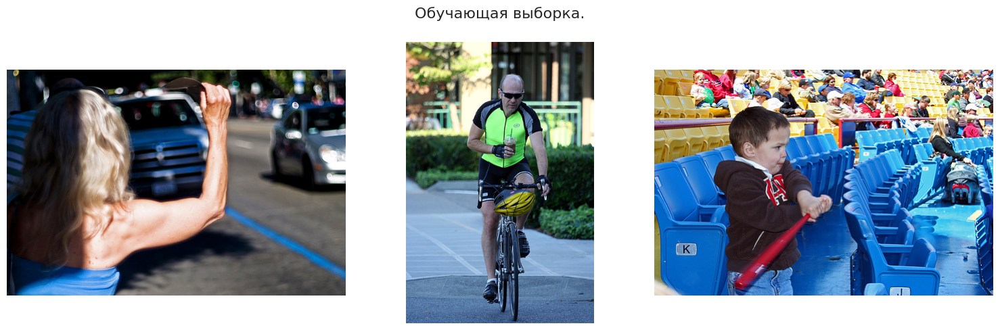

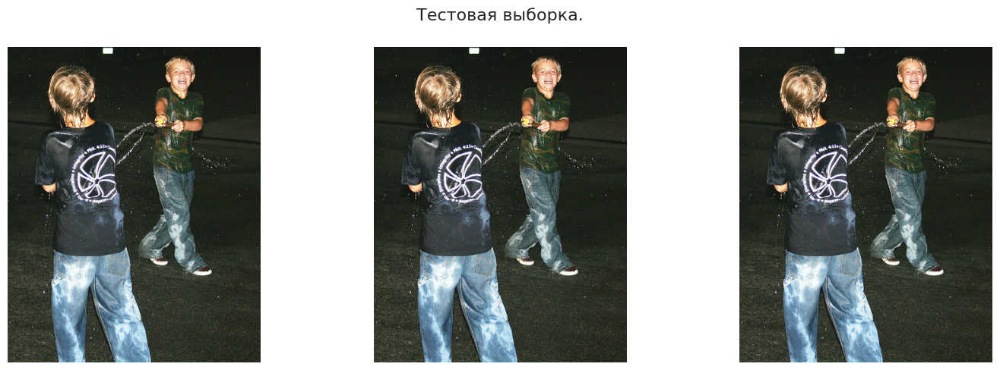

In [6]:
# Проверим результат загрузки изображений.
for df, folder, suptitle in zip([df_train, df_test], [TRAIN_DIR, TEST_DIR],
                                ['Обучающая выборка.', 'Тестовая выборка.']):
    fig, ax = plt.subplots(1, 3, figsize=(MPL_WIDTH, MPL_HEIGHT))
    fig.suptitle(suptitle, fontsize=16)
    for i, file_name in enumerate(df.head(3).image):
        ax[i].imshow(np.array(Image.open(osjoin(folder, file_name))))
        ax[i].axis('off')
        ax[i].set_xticks([])
        ax[i].set_yticks([])
    plt.show();

- Проверка соответствия индекса и столбца `Unnamed: 0` в датафрейме df_test.

In [7]:
if (df_test.index != df_test['Unnamed: 0']).sum() == 0:
    print('Столбец "Unnamed: 0" является индексом.')

Столбец "Unnamed: 0" является индексом.


### Частичная предобработка данных.
- Соаздадим функцию частичной предобработки данных, которая
  - Переименует столбцы в датафреймах с оценками для удобства работы.
  - Удалит столбец `Unnamed: 0` в тестовой выборке, т.к. он содержит только индексы и не несёт полезной информации.
- Вызовем функцию и проверим результат.


In [8]:
# Функция частичной  обработки.
def partial_preproc(df : pd.DataFrame(),
                    name : str) -> pd.DataFrame():
    if name == 'rename':
        df.columns = ['image', 'query_id', 'score_1', 'score_2', 'score_3']
    else:
        df.drop(name, axis=1, inplace=True)

    return df

# Переименуем столбцы.
expert_score = partial_preproc(expert_score, 'rename')
crowd_score = partial_preproc(crowd_score, 'rename')
# Удалим ненужные столбцы.
df_test = partial_preproc(df_test, 'Unnamed: 0')

display(expert_score
        .head(2)
        .style
        .set_caption('Оценки экспертов.')
        .set_table_styles(styles))
print('\n')
display(crowd_score
        .head(2)
        .style
        .set_caption('Краудсорс оценки.')
        .set_table_styles(styles))
print('\n')
display(df_test
        .head(2)
        .style
        .set_caption('Тестовая выборка.')
        .set_table_styles(styles))

,image,query_id,score_1,score_2,score_3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2


,image,query_id,score_1,score_2,score_3
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.000000,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.000000,0,3


,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt and the other in blue , are having a water fight .",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg


### Загрузка данных. Вывод.
- Табличные данные и фотографии загружены.
- Переименованы названия столбцов в датафреймах с оценками.
- Удалён столбец `Unnamed: 0` с индексами в тестовом датафрейме.
- Установлены пути для чтения/записи файлов и пути к папкам с фотографиями для обучения и тестирования.

## Исследовательский анализ данных.  <a cname="chapter4"></a>


### Функции ИАД. <a name="chapter4.1"></a>


Создадим вспомогательные функции для анализа данных.
- Создадим функцию вывода информации о табличных данных, принимающую список и названия датафреймов и выводящую информацию о них.
- Создадим функцию вывода фотографий, которая
  - опционально примет
    - названия фотографий и содеражщих их папок (`train_images` или `test_images`)
    - или `numpy` массив с данными по фотографиям;
    - описания фотографий;
    - заголовок.
  - выведет фотографии и информацию о них в виде графика.
- Создадим функцию проверки пересечения тестового и других датафреймов по парам изображение - id запроса.

#### Функция вывода информации о табличных данных.  <a name="chapter4.1.1"></a>


In [9]:
# Функция вывода информации по табличным данным.
def get_eda_data(df_list : list[pd.DataFrame],
                 name_list : list[str] = None,
                 head : int = 20) -> None:
    if name_list is None:
        name_list = ['Обучающая выборка.', 'Тестовая выборка.',
                     'Краудсорс оценки.', 'Экспертные оценки.']
    for df, name in zip(df_list,
                        name_list):
        print_h(name)
        print_h('~'*len(name))
        print('\n')
        with pd.option_context('display.max_colwidth', 100):
            display(
                df
                .head(head)
                .style
                .set_caption(f'Первые {head} строк датафрейма.')
                .set_table_styles(styles))
        print('\n\033[1m- Кол-во пропусков:\033[0m', df.isna().sum().sum())
        print('\n\033[1m- Кол-во явных дубликатов:\033[0m',
              df.isna().sum().sum())
        print('\n\033[1m- Информация о датафрейме:\033[0m')
        display(df.info(), df.describe(include='all'))
        print_h('~'*70)
        print('\n')

#### Функция вывода фотографий.


In [10]:
# Функция вывода фотографий.
def get_photos(img_labels : pd.Series or np.ndarray = None,
               img_prompt : pd.Series or np.ndarray = None,
               img_folder_name : str = None,
               img_array : np.ndarray = None,
               img_prompt_extra : pd.Series or np.ndarray = None,
               suptitle : str = '') -> None:
    '''
    Функция вывода фотографий.
    Функция выводит фотографии в виде графика по 4 фотографии в строке.
    Параметры:
    - img_labels : названия изоюражений.
    - img_prompt : описания изображений.
    - img_folder_name : название папки с изображениями.
    - img_array : опциональный массив изображений.
    - img_prompt_extra : дополнительные описания изображений.
    - suptitle : заголовок.

    '''

    # Зададим функцию разделения описаний на строки по 5 слов.
    def split_text(text):
        t = ''
        text = text.split()
        for i in range(0, len(text), 5):
            t += (' '.join(text[i:i+5]))
            t += '\n'
        return t

    # Рассчитаем размерность и определим фигуру.
    i, col = 0, 4
    row = (len(img_labels) if img_labels is not None else len(img_array)) // col
    fig = plt.figure(figsize=(MPL_WIDTH, row * MPL_HEIGHT))
    fig.suptitle(suptitle, fontsize=16)
    for i in range(row * col):
        # Определим название и описание, при необходимости.
        file_name = img_labels.iloc[i] if img_labels is not None else ''
        prompt = img_prompt[i] if img_prompt is not None else ''
        prompt_extra = img_prompt_extra[i] if img_prompt_extra is not None else ''
        # Загрузим изображение.
        if img_array is not None:
            # Загрузка векторного представления.
            image = Image.fromarray(img_array[i])
        else:
            # Загрузка изображения из папки.
            image = Image.open(osjoin(img_folder_name, file_name))
        fig.add_subplot(row, col, i + 1)
        # Выведем изображение.
        plt.imshow(np.array(image))
        plt.axis('off')
        plt.title('\n'.join([f'Тип: {image.mode}',
                             f'Размер: {str(image.size)}',
                             split_text(prompt),
                             prompt_extra]),
                  fontsize=12)
        plt.xticks([])
        plt.yticks([])
        plt.tight_layout()
    plt.show();

#### Функция проверки вхождения объектов тестовой выборки в обучающую выборку.


In [11]:
# Функция проверки вхождения элементов датафрейма 1 в датафрейм 2 по
# определённым ключам.
def cross_check(df_to_check_1 : pd.DataFrame = df_test,
                df_to_check_2 : pd.DataFrame = None,
                keys : list = ['image', 'query_id']) -> list | None:

    df_cross_check = pd.merge(df_to_check_2, df_to_check_1, on=keys,
                              how='left', indicator='exists')

    df_cross_check['exists'] = np.where(df_cross_check.exists == 'both',
                                        True, False)

    if df_cross_check['exists'].sum() > 0:
        print('Объекты датафреймов пересекаются.')
        return df_cross_check[df_cross_check['exists'] == True].index
    else:
        print('Объекты датафреймов не пересекаются.')

### Вывод информации о данных.  <a name="chapter4.2"></a>


Вызовем функции и выведем информацию о данных.

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
5,3030566410_393c36a6c5.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
6,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
7,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
8,343218198_1ca90e0734.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
9,3718964174_cb2dc1615e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .



- Кол-во пропусков: 0

- Кол-во явных дубликатов: 0

- Информация о датафрейме:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


None

,image,query_id,query_text
count,5822,5822,5822
unique,1000,977,977
top,3107513635_fe8a21f148.jpg,2600867924_cd502fc911.jpg#2,"Two dogs , one brown and white and one black a..."
freq,10,34,34


,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt and the other in blue , are having a water fight .",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at each other .,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each other .,1177994172_10d143cb8d.jpg
5,1232148178_4f45cc3284.jpg#0,A baby girl playing at a park .,1232148178_4f45cc3284.jpg
6,1232148178_4f45cc3284.jpg#1,A closeup of a child on a playground with adult supervision .,1232148178_4f45cc3284.jpg
7,1232148178_4f45cc3284.jpg#2,A young boy poses for a picture in front of a playground .,1232148178_4f45cc3284.jpg
8,1232148178_4f45cc3284.jpg#3,A young girl is smiling in front of the camera at a park .,1232148178_4f45cc3284.jpg
9,1232148178_4f45cc3284.jpg#4,There is a little blond hair girl with a green sweatshirt and a red shirt playing on a playground .,1232148178_4f45cc3284.jpg



- Кол-во пропусков: 0

- Кол-во явных дубликатов: 0

- Информация о датафрейме:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 11.8+ KB


None

,query_id,query_text,image
count,500,500,500
unique,500,500,100
top,989851184_9ef368e520.jpg#4,The black dog has a toy in its mouth and a per...,989851184_9ef368e520.jpg
freq,1,1,5


,image,query_id,score_1,score_2,score_3
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.000000,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.000000,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.000000,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.000000,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.000000,0,3
5,1056338697_4f7d7ce270.jpg,2204550058_2707d92338.jpg#2,0.000000,0,3
6,1056338697_4f7d7ce270.jpg,2224450291_4c133fabe8.jpg#2,0.000000,0,3
7,1056338697_4f7d7ce270.jpg,2248487950_c62d0c81a9.jpg#2,0.333333,1,2
8,1056338697_4f7d7ce270.jpg,2307118114_c258e3a47e.jpg#2,0.000000,0,3
9,1056338697_4f7d7ce270.jpg,2309860995_c2e2a0feeb.jpg#2,0.000000,0,3



- Кол-во пропусков: 0

- Кол-во явных дубликатов: 0

- Информация о датафрейме:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   image     47830 non-null  object 
 1   query_id  47830 non-null  object 
 2   score_1   47830 non-null  float64
 3   score_2   47830 non-null  int64  
 4   score_3   47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


None

,image,query_id,score_1,score_2,score_3
count,47830,47830,47830.000000,47830.000000,47830.000000
unique,1000,1000,NaN,NaN,NaN
top,1572532018_64c030c974.jpg,249394748_2e4acfbbb5.jpg#2,NaN,NaN,NaN
freq,120,169,NaN,NaN,NaN
mean,NaN,NaN,0.068786,0.208488,2.820155
std,NaN,NaN,0.207532,0.628898,0.656676
min,NaN,NaN,0.000000,0.000000,0.000000
25%,NaN,NaN,0.000000,0.000000,3.000000
50%,NaN,NaN,0.000000,0.000000,3.000000
75%,NaN,NaN,0.000000,0.000000,3.000000


,image,query_id,score_1,score_2,score_3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2
5,1056338697_4f7d7ce270.jpg,3360930596_1e75164ce6.jpg#2,1,1,1
6,1056338697_4f7d7ce270.jpg,3545652636_0746537307.jpg#2,1,1,1
7,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,1,1,2
8,106490881_5a2dd9b7bd.jpg,1425069308_488e5fcf9d.jpg#2,1,1,1
9,106490881_5a2dd9b7bd.jpg,1714316707_8bbaa2a2ba.jpg#2,2,2,2



- Кол-во пропусков: 0

- Кол-во явных дубликатов: 0

- Информация о датафрейме:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   score_1   5822 non-null   int64 
 3   score_2   5822 non-null   int64 
 4   score_3   5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.5+ KB


None

,image,query_id,score_1,score_2,score_3
count,5822,5822,5822.000000,5822.000000,5822.000000
unique,1000,977,NaN,NaN,NaN
top,754852108_72f80d421f.jpg,2600867924_cd502fc911.jpg#2,NaN,NaN,NaN
freq,10,34,NaN,NaN,NaN
mean,NaN,NaN,1.436620,1.624356,1.881999
std,NaN,NaN,0.787084,0.856222,0.904087
min,NaN,NaN,1.000000,1.000000,1.000000
25%,NaN,NaN,1.000000,1.000000,1.000000
50%,NaN,NaN,1.000000,1.000000,2.000000
75%,NaN,NaN,2.000000,2.000000,2.000000


,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg
5,424307754_1e2f44d265.jpg
6,3044359043_627488ddf0.jpg
7,3396275223_ee080df8b5.jpg
8,2977379863_2e8d7a104e.jpg
9,634891010_9fa189effb.jpg


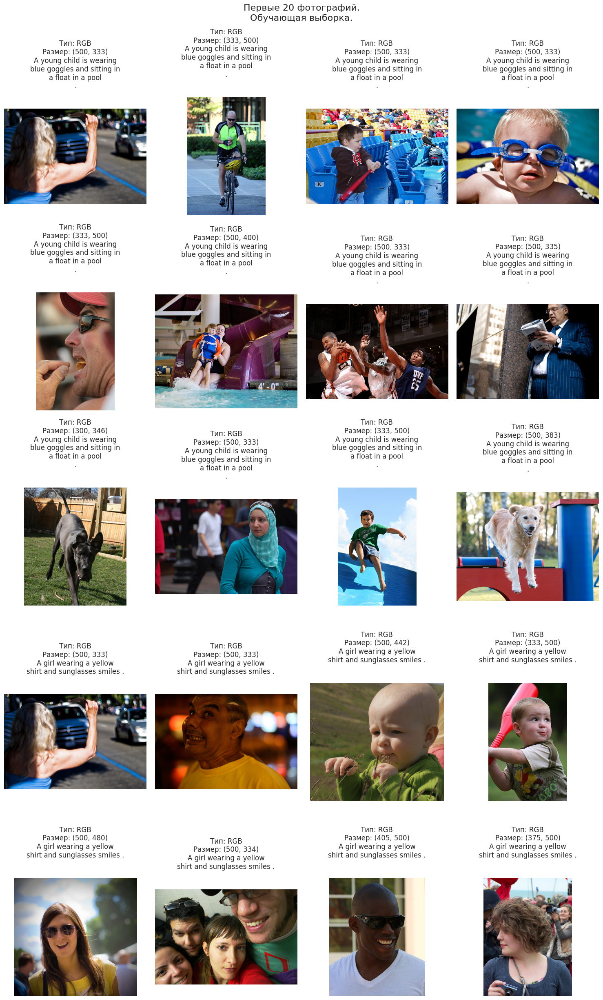

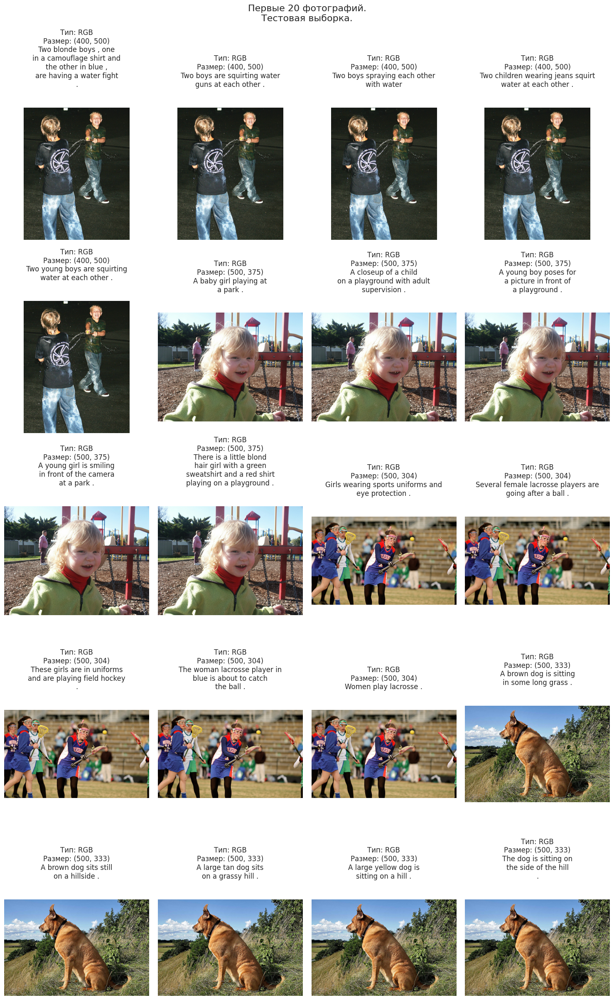

In [12]:
# Выведем первые строки и информацию о данных.
get_eda_data([df_train, df_test, crowd_score, expert_score])

# Выведем первые 10 строк списка изображений для теста.
display(test_images
        .head(10)
        .style
        .set_caption('Список изображений для теста. Первые 10 строк.')
        .set_table_styles(styles))

# Выведем первые 20 фотографий обучающей и тестовой выборок.
print('\n')
get_photos(df_train.image[:20], df_train.query_text.iloc[:20], TRAIN_DIR,
           suptitle=('Первые 20 фотографий.\nОбучающая выборка.\n'))
print('\n')
get_photos(df_test.image.iloc[:20], df_test.query_text.iloc[:20], TEST_DIR,
           suptitle=('Первые 20 фотографий.\nТестовая выборка.\n'))

### Вывод дополнительной информации.
- Выведем столбчатые диаграммы для распределения оценок.
- Выведем график согласованности экспертных оценок.
- Выведем график согласованности краудсорс оценок.
- Выведем первые фотографии с разнящимися оценками экспертов.
- Сравним списки уникальных названий фотографий для всех обучающих и тестовых наборов отдельно.


- Названия изображений в датафреймах "test_images" и "df_test" соответствуют.

- Названия изображений в датафреймах "df_train" и "expert_score" соответствуют.

- Названия изображений в датафреймах "df_train" и "expert_score" соответствуют.

- Датафрейм Обучающий не имеет общих пар изображение - id запроса с тестовым.
Объекты датафреймов не пересекаются.

- Датафрейм Экспертные оценки не имеет общих пар изображение - id запроса с тестовым.
Объекты датафреймов не пересекаются.

- Датафрейм Краудсорс оценки не имеет общих пар изображение - id запроса с тестовым.
Объекты датафреймов не пересекаются.


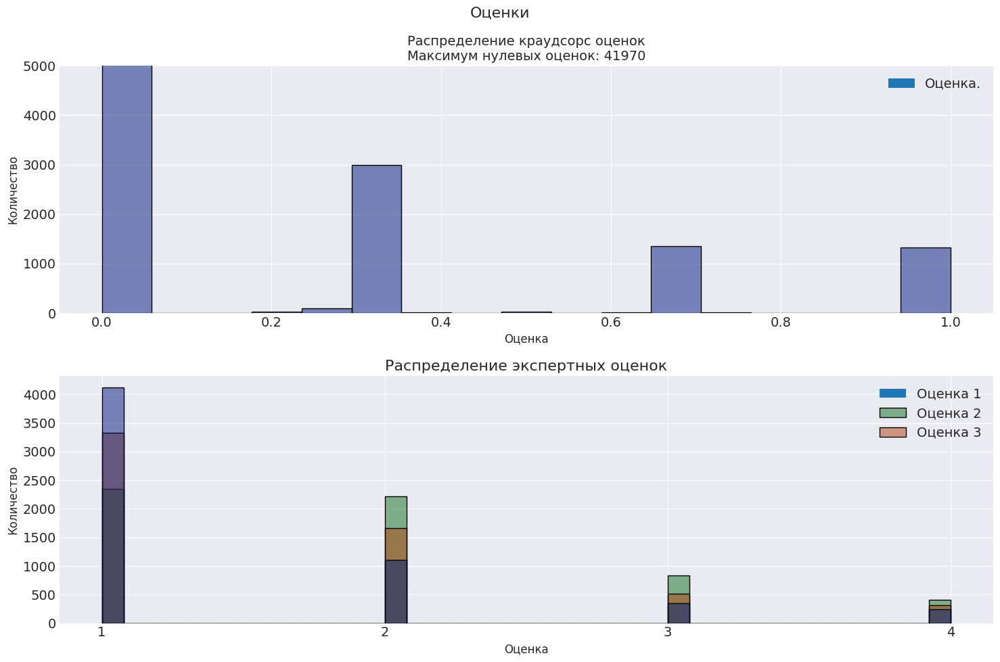

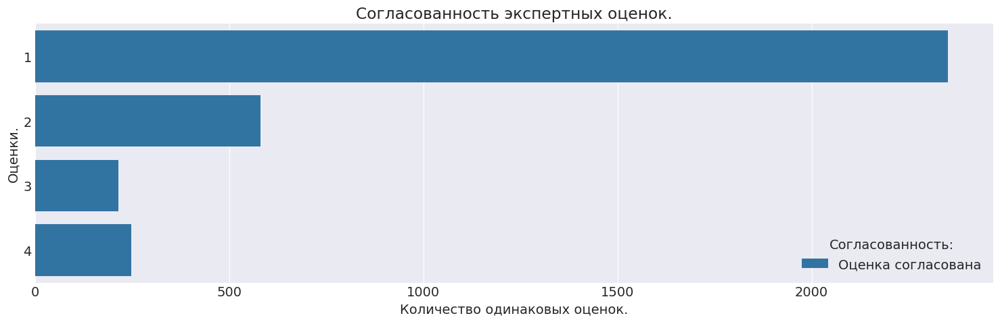

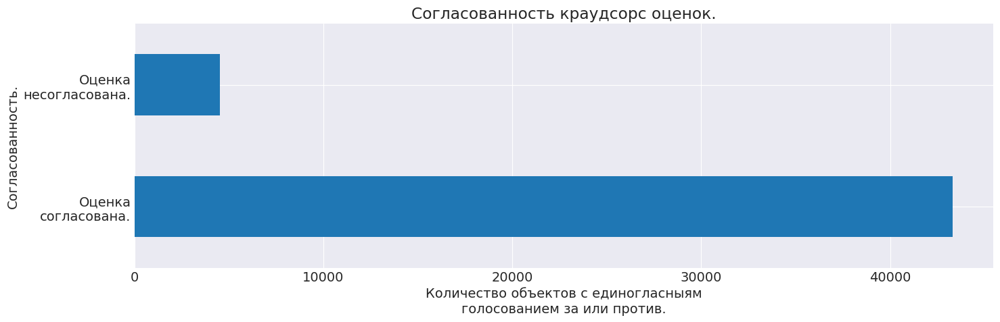

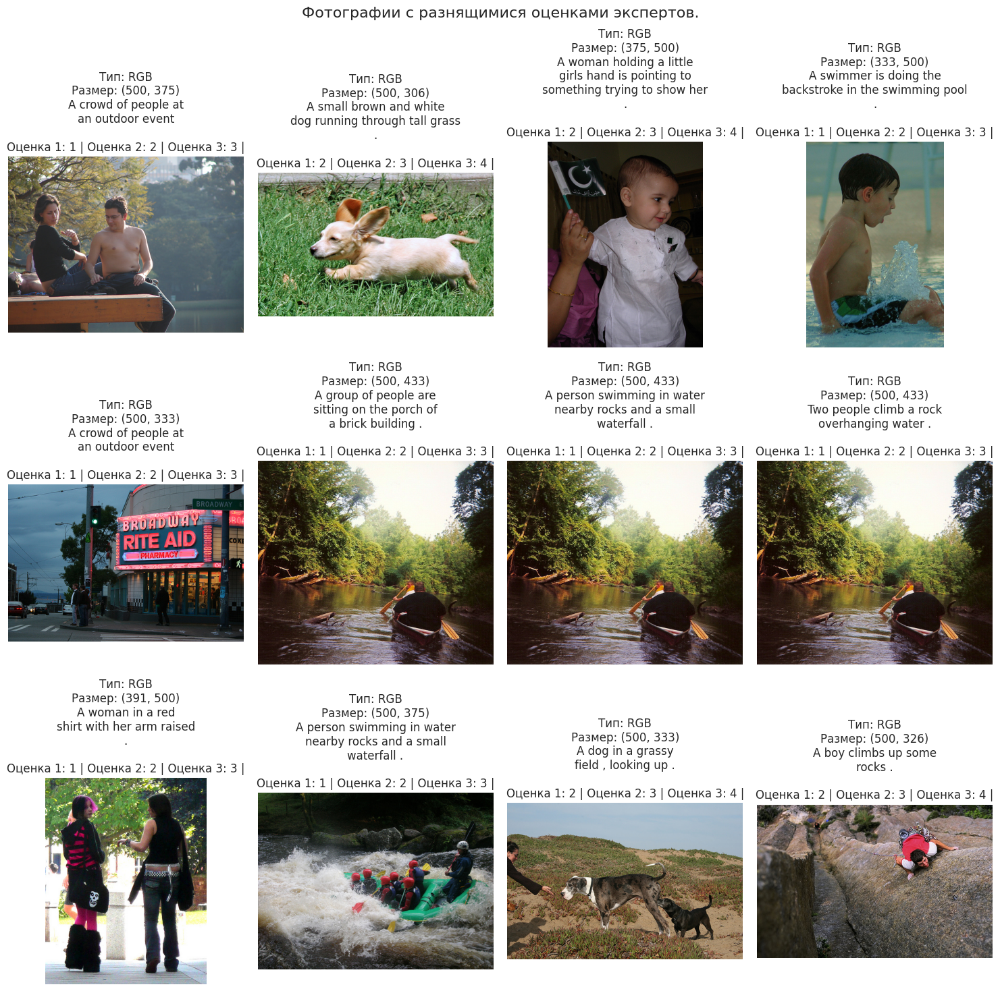

In [13]:
# Соответствие названий изображений в двух датафреймах.
if ((np.sort(df_test.image.unique()) ==\
    np.sort(test_images.image.unique())).sum()):
    print_b('\n- Названия изображений в датафреймах "test_images" и "df_test" '+
          'соответствуют.')

# Соответствие названий изображений в двух датафреймах.
if ((np.sort(df_train.image.unique()) ==\
    np.sort(expert_score.image.unique())).sum()):
    print_b('\n- Названия изображений в датафреймах "df_train" и '+
          '"expert_score" соответствуют.')

# Соответствие названий изображений в двух датафреймах.
if ((np.sort(df_train.image.unique()) ==\
    np.sort(crowd_score.image.unique())).sum()):
    print_b('\n- Названия изображений в датафреймах "df_train" и '+
          '"expert_score" соответствуют.')

# Проверка пересечения датафреймов с тестовым.
for df, name in zip([df_train, expert_score, crowd_score],
                    ['Обучающий', 'Экспертные оценки', 'Краудсорс оценки']):
    print_b(f'\n- Датафрейм {name} не имеет общих пар изображение - '+
            'id запроса с тестовым.')
    cross_check(df_to_check_2 = df)

# Построим и выведем столбчатые диаграммы для распределения оценок.
df_list = [crowd_score.score_1.to_frame(),
           expert_score[['score_1', 'score_2', 'score_3']]]
title_list = ['Распределение краудсорс оценок',
              'Распределение экспертных оценок']
fig, ax = plt.subplots(2, 1, figsize=(MPL_WIDTH, MPL_HEIGHT*len(df_list)))
fig.suptitle('Оценки', fontsize=16)
for i, (df, title) in enumerate(zip(df_list, title_list)):
    sns.histplot(df, palette='dark', ax=ax[i])
    ax[i].set_xlabel('Оценка', fontsize=12)
    ax[i].set_ylabel('Количество', fontsize=12)
    if df.iloc[:,0].max() > 1:
        ax[i].set_xticks(range(1, 5, 1))
        ax[i].set_xticklabels(range(1, 5, 1))
        ax[i].legend(['Оценка 1', 'Оценка 2', 'Оценка 3'])
        ax[i].set_title(title, fontsize=16)
    else:
        ax[i].set_ylim(0, 5000)
        ax[i].legend(['Оценка.'])
        ax[i].set_title((
            title+
            f'\nМаксимум нулевых оценок: {(df.iloc[:,0] == 0).sum()}'
            ), fontsize=14)
plt.show();
print('\n')

# Построим и выведем график согласованности экспертных оценок.
expert_agrement = []
for score in range(1, 5):
    expert_agrement.append([
        'Оценка согласована',
        score,
        expert_score.query('score_1 == score_2 ==\
                            score_3 == @score')['query_id'].count()
                            ])
expert_agrement = pd.DataFrame(expert_agrement)
sns.barplot(data=expert_agrement, orient='horizontal', x=2, y=1, hue=0)
plt.title('Согласованность экспертных оценок.')
plt.xlabel('Количество одинаковых оценок.')
plt.ylabel('Оценки.')
plt.legend(title='Согласованность:')
plt.show();
print('\n')

# Построим и выведем график согласованности краудсорс оценок.
crowd_agreement = pd.Series(
    [crowd_score.query('(score_3 == 0 & score_2 != 0) or \
                        (score_3 != 0 & score_2 == 0)')['score_2'].count(),
     crowd_score.query('score_3 != 0 & score_2 != 0')['score_2'].count()]
    )
crowd_agreement.plot.barh()
plt.title('Согласованность краудсорс оценок.')
plt.xlabel('Количество объектов с единогласныям\nголосованием за или против.')
plt.ylabel('Согласованность.')
plt.yticks(range(2), ['Оценка\nсогласована.', 'Оценка\nнесогласована.'])
plt.show();
print('\n')

# Выведем первые фотографии с разнящимися оценками экспертов.
expert_score_head = expert_score.query('score_1 != score_2 \
                                        != score_3').head(12)
expert_score_head = expert_score_head.merge(df_train[['image',
                                                      'query_id',
                                                      'query_text']],
                                            on=['image', 'query_id'],
                                            how='left')
get_photos(expert_score_head.image,
           expert_score_head.query_text,
           TRAIN_DIR,
           suptitle='Фотографии с разнящимися оценками экспертов.',
           img_prompt_extra=expert_score_head.apply(
               lambda row: ' '.join([ f'Оценка 1: {row["score_1"]} |',
                                      f'Оценка 2: {row["score_2"]} |',
                                      f'Оценка 3: {row["score_3"]} |']),
               axis=1))

### Исследовательский анализ данных. Вывод.

- Задача МО.
  - Т.к. целевой признак определён и непрерывен, и в соответствие требуемым моделям, задача МО сводится к обучению с учителем, регрессионному анализу.
- Размерность датафреймов.
  - Обучающая (и валидационная) выборка: 5822Х3.
  - Тестовая выборка: 500Х3.
  - Краудсорс оценки: 47831Х5
  - Экспертные оценки: 5822Х5.
- Количество изображений:
  - Обучающая выборка: 1000, соответствует кол-ву уникальных названий изображений в обучающем датафрейме, датафреймах с экспертными и краудсорс оценками, что говорит о возможности слияния этих датафреймов в одну обучающую выборку.
  - Тестовая выборка: 100, соответствует кол-ву уникальных названий изображений в тестовом датафрейме и спике названий изображений, что делает этот список избыточным.

- Явные пропуски и дубликаты во всех датафреймах отсутствуют.
  - В датафреймах присутствует большое кол-во (более 5 на одно фото) повторов текстов.

- Кол-во уникальных запросов:
  - Обучающая выборка: 977.
  - Тестовая: 500

- Общие пары название изображения - id запроса ни одного из трёх датафреймов (обучающего, экспертных и краудсорс оценок) не пересекаются с парами в тестовом наборе. Данные пары можно использовать как ключи при объединении трёх обучающих выборок.

- Наличие контента детской тематики.<br>
И в тестовом и в обучающем наборах, заметны описания и фотографии с участием детей, которые необходимо будет обработать.

- Фотографии случайны, не предобработаны, имеют различные размеры, требуют нормализации.

- Оценки.
  - И экспертные и краудсорс оценки тяготеют к указанию несоответствия описаний фотографиям.
  При чём краудсорс оценки ярко выделяются максимумом нулевых оценок - 41970, т.е. почти все, что говорит не в пользу качества оценок и внешнего объединения, но количества краудсорс оценок может быть достаточно, чтобы модели обучились против оценщиков.<br>
  - Эксперты чаще согласованно ставят нулевые оценки.
  - Один из экспертов также не находит большого сходства описаний-фотографий, что логично, т.к. два человека на фотографии едва ли соответствут описанию "толпы".
  - Практически все краудсорс оценки приняты единогласно, что является хорошим аргументом в пользу внешнего объединения, т.е. если бы согласия не было, такие зашумлённые данные не принесли бы чёткого сигнала.

- ИТОГ:
  - Формирование обучающей выборки.
    - Данные трёх датафреймов, обучающего, с экспертными и краудсорс оценками, не пересекаются с тестовым набором и имеют общие ключи - пару названия изображений - id запросов, что позволяет объединить эти три датайрейма для использования в обучении моделей.
    - Почти в 10 раз большее количество данных и, отчасти, единогласные краудсорс-оценки перевешивают опасения о потере в качестве.
    - Объединим датафреймы внешним объединением по парам названия изображений - id запроса для получения максимального кол-ва данных.
  - Контент с детской тематикой присутствует и его необходимо удалить из обучающего набора. Т.к. Текст запросов по всем трём выборкам присутствует в обучающей, обработаем уникальные тексты в данной выборке до объединения, и добавим тексты по id запросов в результирующий обучабщий датафрейм.



## Предобработка данных.
- Зададим функцию вывода информации о результирующих датафреймах.<br>

- Отфильтруем  данные обучающей выборки в соответствии с юридическими требованиями. <br>

- Объединим датафреймы ккраудсорс и экспертных оценок в один датафрейм полным внешним объединением, так чтобы все записи обоих датафреймов вошли в обучающую выборку.<br>
Таким образом мы получим максимальный объем данных для обучения, жертвую точностью, т.к. краудсорс оценок будет намного больше экспертных, но дадим модели возможность обучиться на большем объеме данных.<br>

- Соберём все оценки в один целевой признак:
  - для записей, в которых есть оценки экспертов, укажем агрегат этих оценок как среднее заданных долей (описано в разделе [Установка параметров.](#chapter6));
  - для остальных записей укажем краудсорс оценку.<br>

### Функция вывода информации о датафрейме.

In [14]:
# Функция вывода информации о эмбеддингах.
def get_df_info(data : pd.DataFrame,
                caption : str = '') -> None:

    # Выведем информацию по результату создания эмбеддингов.
    print_b(f'{caption}\n Первые 5 строк.')
    display(data.head(5))
    print_b(f'\n- {caption}\n Последние 5 строк.')
    display(data.tail(5))
    print_b('\n- Размер датафрейма: ',
        f'{data.shape}')
    print_b('\n- Информация о датафрейме.')
    display(data.info())

### Фильтрация данных.  <a class="anchor" id="chapter5"></a>


Для исключения изображений с детьми в соответсвии с заданием исключим текстовые описания/запросы, содержащие стоп-слова, свзянные с детьми.<br>
Для этого воспользуемся списком стоп-слов по детской тематике в словаре синонимов [__Meriam Webster__](https://www.merriam-webster.com/thesaurus/child).

- Создадим список стоп-слов по детской тематике для использования в функциии фильтрации описаний для обучающей выборки и при тестировании.
- Создадим функцию фильтрации текстовых описаний.
- Соберём и очистим уникальные пары текстовых описаний - идентификаторов из обучающей выборки. Запишем очищенные пары в переменную для последующего добавления в итоговую обучающую выборку.


In [15]:
child_related_words = '''child boy girl minor juvenile preschooler
                         kindergartener kindergartner schoolchild schoolboy
                         schoolkid schoolgirl teen teenager preteen tween
                         teener subteen preteen-ager youngboy younggirl
                         neonate baby infant newborn adolescent tots moppet
                         whelp bambino sprat youngling toddler tike tyke
                         weanling nestling teenybopper stripling tomboy
                            '''.split()
child_related_words.extend(['young boy', 'young girl', 'young child'])
print('\033[1mСписок стоп-слов по детской тематике: \033[0m')
child_related_words

Список стоп-слов по детской тематике: 


['child',
 'boy',
 'girl',
 'minor',
 'juvenile',
 'preschooler',
 'kindergartener',
 'kindergartner',
 'schoolchild',
 'schoolboy',
 'schoolkid',
 'schoolgirl',
 'teen',
 'teenager',
 'preteen',
 'tween',
 'teener',
 'subteen',
 'preteen-ager',
 'youngboy',
 'younggirl',
 'neonate',
 'baby',
 'infant',
 'newborn',
 'adolescent',
 'tots',
 'moppet',
 'whelp',
 'bambino',
 'sprat',
 'youngling',
 'toddler',
 'tike',
 'tyke',
 'weanling',
 'nestling',
 'teenybopper',
 'stripling',
 'tomboy',
 'young boy',
 'young girl',
 'young child']

#### Функция поиска изображений с детсвой тематикой в описании.
- Создадим функцию, которая
  - примет на вход
    - обучающий датафрейм;
    - список стоп-слов;
    - флаги типов обработки;
  - найдёт и вернёт список изображений, связанных с детьми, по леммам и нижнему регистру

In [16]:
df_train.loc[[0, 1], 'image']

0    1056338697_4f7d7ce270.jpg
1    1262583859_653f1469a9.jpg
Name: image, dtype: object

In [17]:
def get_stop_images(
        df : pd.DataFrame = (df_train
                             .drop_duplicates(['query_id', 'query_text'])
                             .reset_index(drop=True)),
        stop_words: list = child_related_words,
        lower: bool = True,
        lemma: bool = True) -> pd.DataFrame:

    # Получим список изображений, соответствующих запросу.
    df = df.copy()
    df['image_match'] = df['query_id'].apply(lambda x: x.split('#')[0])
    
    # Определим матчеры.
    if lower:
        matcher_lower = PhraseMatcher(nlp.vocab, attr='LOWER')
        patterns_lower = [nlp.make_doc(word) for word in stop_words]
        matcher_lower.add('CHILD_RELATED', None, *patterns_lower)
    if lemma:
        matcher_lemma = PhraseMatcher(nlp.vocab, attr='LEMMA')
        patterns_lemma = [nlp(word) for word in stop_words]
        matcher_lemma.add('CHILD_RELATED', None, *patterns_lemma)

    # Создадим объект doc.
    texts = df.query_text.values
    docs = list(nlp.pipe(texts))

    # Найдём изображения с детской тематикой в описании.
    stop_texts_idx= []
    for i, doc in enumerate(docs):
        if lower: matches = matcher_lower(doc)
        if lemma: matches.extend(matcher_lemma(doc))

        if matches:
            stop_texts_idx.append(i)

    stop_images_names = (df
                         .loc[stop_texts_idx, 'image_match']
                         .drop_duplicates()
                         .tolist())
    stop_texts = (df
                  .loc[stop_texts_idx, 'query_text']
                  .drop_duplicates())
    
    # Вернём список изображений.
    return stop_images_names, stop_texts.to_frame()

#### Фильтрация данных.
- Вызовем функцию и получим названия изображений с детской тематикой.
- Проверим результат.

In [18]:
%%time
# Версия 2
stop_images_names, stop_texts = get_stop_images()
print_b('Обнаружено в занесено в список изображений с детской '+
        f'тематикой: {len(stop_images_names)}\n')
display(stop_texts
        .head(10)
        .style
        .set_caption('Тексты с детской тематикой.\n Первые 10 строк.').
        set_table_styles(styles))

Обнаружено в занесено в список изображений с детской тематикой: 277



,query_text
0,A young child is wearing blue goggles and sitting in a float in a pool .
1,A girl wearing a yellow shirt and sunglasses smiles .
6,A young boy dressed in a red uniform kicks the soccer ball on the field as another child in blue watches from behind .
9,A little boy shakes the snow off of a tree .
12,A little girl wearing sunglasses puts her feet into the kitchen sink .
16,A young boy in a swimming suit sits in water .
20,A child is preparing to slide down a piece of playground equipment .
21,The baby in suspenders sits by a toy .
26,A man and young girl eat a meal on a city street .
27,A young boy kicks a soccer ball while six others play but are dressed as referee .


CPU times: user 1min 40s, sys: 1.47 s, total: 1min 41s
Wall time: 1min 41s


In [19]:
# %%time
# texts_and_ids_clean = clean_texts()

# # Вывод результатов.
# display(df_train[['query_id', 'query_text']]
#         .head(10)
#         .style
#         .set_caption('Оригинальный датафрейм.\n Первые 10 строк.')
#         .set_table_styles(styles))
# print('\n')
# display(texts_and_ids_clean
#         .head(10)
#         .style
#         .set_caption('Очищенный датафрейм.\n Первые 10 строк.')
#         .set_table_styles(styles))
# print('\n', '~' * 70, '\n')
# total_unique_pairs = (df_train[["query_id", "query_text"]]
#                       .drop_duplicates()
#                       .shape[0])
# print('\n\033[1mУдалено уникальных записей с "вредным" контентом: \033[0m'+
#         f'{total_unique_pairs - texts_and_ids_clean.shape[0]}')
# print('\n\033[1mКоличество значений "child"\n  - в оригинальном датафрейме:'+
#       f' \033[0m{df_train.query_text.str.contains("child").sum()}'+
#       '\033[1m\n  - в очищенном датафрейме: \033[0m' +
#       f'{texts_and_ids_clean.query_text.str.contains("child").sum()}')

# print('\033[1m\nИнформация по очищенному датафрейму:\033[0m')
# print(f'\n\033[1m- Размер: {texts_and_ids_clean.shape}')
# print('\n\033[1m- Количество дубликатов: \033[0m'+
#         f'{texts_and_ids_clean.duplicated().sum()}')
# print('\n')
# display(texts_and_ids_clean.info())
# print('\n')

#### Фильтрация данных. Вывод.

- Объекты с описаниями по детской тематике успешно удалены.
- Найдено 277 изображений с детской тематикой.

### Формирование обучающей выборки.

- Сформируем обучающую выборку, используя внешнее объединение и пары id запроса - название изображения как ключи.
- Добавим уникальные тексты запросов в записи с соответстующими id.
- Удалим записи с текстом по детской тематике в описаниях, воспользовавшись спиской изображений, созданном в предыдущем разделе.
- Проверим результат.

#### Функция формирования обучающей выборки.

In [20]:
# Функция формирования обучающей выборки.
def make_train(crowd_score: pd.DataFrame = crowd_score,
               expert_score: pd.DataFrame = expert_score,
               train : pd.DataFrame = df_train[['query_text', 'query_id']],
               stop_images_names : list = stop_images_names,
               merge_how: str = 'outer',
               keys : list = ['image', 'query_id']) -> pd.DataFrame:

    # Объединим данные краудсорс и экспертных оценок.
    scores_merged = (crowd_score
                     .drop(['score_2', 'score_3'], axis=1)
                     .merge(expert_score,
                            on=keys,
                            how=merge_how,
                            suffixes=('_crowd', '_expert')))

    # Добавим тексты запросов из обучающей выборки, соответствующие id
    # запросов в объединенной выборке.
    train = train.drop_duplicates(subset=['query_id'])
    scores_merged = scores_merged.merge(train, on=['query_id'], how='left')
    
    # ВЕРСИЯ 2
    # Удалим записи с детской тематикой.
    print_b('Удалено записей с детской тематикой:', 
            (scores_merged
             .loc[scores_merged['image'].isin(stop_images_names), 'image']
             .count()))
    scores_merged.drop(scores_merged[scores_merged['image'].isin(stop_images_names)]
                       .index, 
                       axis=0,
                       inplace=True)
    

    # Удалим объекты с отсутствующим текстом запроса.
    scores_merged.dropna(subset=['query_text'], inplace=True)

    return scores_merged

#### Формирование обучающей выборки.
- Вызовем функцию и объединим оценки.
- Проверим результат.

In [21]:
df_train_merged = make_train()

# Выведем данные по результату объединения.
print('\n')
get_df_info(df_train_merged, 'Датафрейм с объединёнными оценками.')
print('\n', '~' * 70, '\n')
print_b('Информация по объединению:')
print_b(f'\n- Количество пропусков:')
display(df_train_merged.isna().sum())
print_b('\n- Количество дубликатов пар названий изображений'+
        ' - id запроса: '+
        f'{df_train_merged[["image", "query_id"]].duplicated().sum()}')
print_b('\n- Количество пересекающихся оценок:',
        (df_train_merged
        .query("score_1_crowd.notna() & score_1_expert.notna()")["image"]
        .count()))
score_combined_nan = (df_train_merged
                      .query('score_1_crowd.isna() & \
                             score_1_expert.isna()')['image'].count())
print_b('\n- Количество пропусков и экспертных и краудсорс оценок: '+
        f'{score_combined_nan}')

Удалено записей с детской тематикой: 14069


Датафрейм с объединёнными оценками.
 Первые 5 строк.


,image,query_id,score_1_crowd,score_1_expert,score_2,score_3,query_text
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,NaN,NaN,NaN,"A woman is signaling is to traffic , as seen f..."
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,NaN,NaN,NaN,A boy in glasses is wearing a red shirt .
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,NaN,NaN,NaN,A young boy holds onto a blue handle on a pier .
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,NaN,NaN,NaN,"A woman wearing black clothes , a purple scarf..."
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,NaN,NaN,NaN,An older woman with blond hair rides a bicycle...



- Датафрейм с объединёнными оценками.
 Последние 5 строк.


,image,query_id,score_1_crowd,score_1_expert,score_2,score_3,query_text
51318,997722733_0cb5439472.jpg,543007912_23fc735b99.jpg#2,0.000000,NaN,NaN,NaN,Two girls with orange shirts .
51319,997722733_0cb5439472.jpg,544576742_283b65fa0d.jpg#2,0.333333,NaN,NaN,NaN,A woman in jeans rock climbing .
51320,997722733_0cb5439472.jpg,872622575_ba1d3632cc.jpg#2,1.000000,NaN,NaN,NaN,A man is climbing the side of a mountain .
51321,997722733_0cb5439472.jpg,888425986_e4b6c12324.jpg#2,0.000000,NaN,NaN,NaN,A person flipping upside down
51322,997722733_0cb5439472.jpg,997722733_0cb5439472.jpg#2,0.666667,NaN,NaN,NaN,A person in a red shirt climbing up a rock fac...



- Размер датафрейма:  (36473, 7)

- Информация о датафрейме.
<class 'pandas.core.frame.DataFrame'>
Index: 36473 entries, 0 to 51322
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   image           36473 non-null  object 
 1   query_id        36473 non-null  object 
 2   score_1_crowd   34079 non-null  float64
 3   score_1_expert  4171 non-null   float64
 4   score_2         4171 non-null   float64
 5   score_3         4171 non-null   float64
 6   query_text      36473 non-null  object 
dtypes: float64(4), object(3)
memory usage: 2.2+ MB


None


 ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ 

Информация по объединению:

- Количество пропусков:


image                 0
query_id              0
score_1_crowd      2394
score_1_expert    32302
score_2           32302
score_3           32302
query_text            0
dtype: int64


- Количество дубликатов пар названий изображений - id запроса: 0

- Количество пересекающихся оценок: 1777

- Количество пропусков и экспертных и краудсорс оценок: 0


#### Формирование обучающей выборки. Вывод.

- Обучающая выборка сформирована.
<br>
Перейдём к агрегации оценок.

### Агрегация оценок.

- Создадим и добавим агрегат оценок эксепртов.
- Заполним оставшиеся пропуски краудсорс оценками.
- Сбросим оригиналы признаков с оценками.
- Проверим результат.


#### Функция агрегации оценок.

In [22]:
# Функция объединения оценок.
def merge_scores(df : pd.DataFrame,
                 score_1 : float = SCORE_EXPERT_1,
                 score_2 : float = SCORE_EXPERT_2,
                 score_3 : float = SCORE_EXPERT_3,
                 score_4 : float = SCORE_EXPERT_4,
                 target : str = TARGET,
                 strategy_expert : str = 'mean',
                 combine : bool = True):

    # Создадим копию датафрейма.
    df = df.copy()

    # Зададим стартегию объединения экспертных оценок.
    if strategy_expert == 'mean':
        def _expert_agg(x):
            return x.mean()
    elif strategy_expert == 'median':
        def _expert_agg(x):
            return x.median()

    # Заменим и усредним оценки экспертов.
    df[['score_1_expert', 'score_2', 'score_3']] = (
        df[['score_1_expert', 'score_2', 'score_3']]
        .replace({1: score_1, 2: score_2, 3: score_3, 4: score_4})
        )

    # Соаздадим целевой признак и заполним его оценками экспертов.
    df[target] = (
        df[['score_1_expert', 'score_2', 'score_3']]
        .apply(lambda x: x.mean(), axis=1)
        )

    # Заполним пропуски краудсорс оценками.
    df.fillna({target : df['score_1_crowd']}, inplace=True)

    # Сбросим ненужные столбцы.
    df.drop(['score_1_crowd', 'score_1_expert',
             'score_2', 'score_3'],
            axis=1, inplace=True)

    # Сбросим индекс.
    df.reset_index(drop=True, inplace=True)

    return df

#### Агрегация оценок.

Датафрейм с объединёнными оценками.
 Первые 5 строк.


,image,query_id,query_text,score
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,"A woman is signaling is to traffic , as seen f...",1.0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,A boy in glasses is wearing a red shirt .,0.0
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,A young boy holds onto a blue handle on a pier .,0.0
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,"A woman wearing black clothes , a purple scarf...",0.0
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,An older woman with blond hair rides a bicycle...,0.0



- Датафрейм с объединёнными оценками.
 Последние 5 строк.


,image,query_id,query_text,score
36468,997722733_0cb5439472.jpg,543007912_23fc735b99.jpg#2,Two girls with orange shirts .,0.000000
36469,997722733_0cb5439472.jpg,544576742_283b65fa0d.jpg#2,A woman in jeans rock climbing .,0.333333
36470,997722733_0cb5439472.jpg,872622575_ba1d3632cc.jpg#2,A man is climbing the side of a mountain .,1.000000
36471,997722733_0cb5439472.jpg,888425986_e4b6c12324.jpg#2,A person flipping upside down,0.000000
36472,997722733_0cb5439472.jpg,997722733_0cb5439472.jpg#2,A person in a red shirt climbing up a rock fac...,0.666667



- Размер датафрейма:  (36473, 4)

- Информация о датафрейме.
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36473 entries, 0 to 36472
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       36473 non-null  object 
 1   query_id    36473 non-null  object 
 2   query_text  36473 non-null  object 
 3   score       36473 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.1+ MB


None


 ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ 

Информация по объединению:

- Количество экспертных оценок в результирующем датафрейме:  4171

- Количество пропусков:


image         0
query_id      0
query_text    0
score         0
dtype: int64

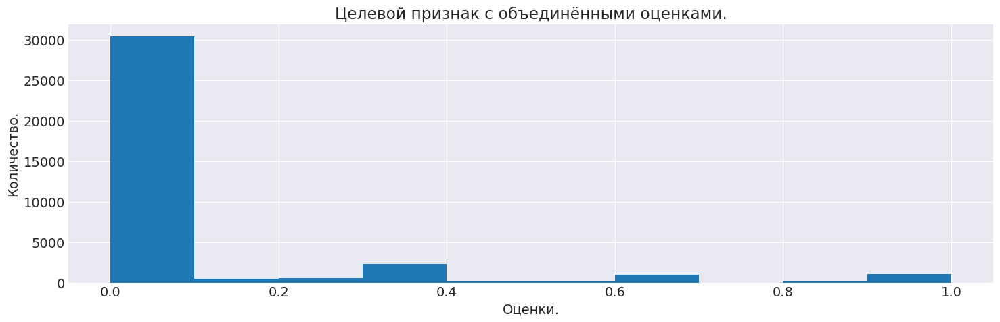



CPU times: user 1.99 s, sys: 230 ms, total: 2.22 s
Wall time: 1.84 s


In [23]:
%%time
df_train_agg = merge_scores(df_train_merged)

# Выведем данные по результату объединения агрегации оценок.
get_df_info(df_train_agg, 'Датафрейм с объединёнными оценками.')

print('\n', '~' * 70, '\n')
print_b('Информация по объединению:\n')
print_b('- Количество экспертных оценок в результирующем датафрейме: ',
 (expert_score.merge(df_train_agg,
                     on=['image', 'query_id'],
                     how='left',
                     indicator=True)['_merge'] == 'both').sum())
print_b(f'\n- Количество пропусков:')
display(df_train_agg.isna().sum())
print('\n')
df_train_agg.score.hist()
plt.title('Целевой признак с объединёнными оценками.')
plt.xlabel('Оценки.')
plt.ylabel('Количество.')
plt.show();
print('\n')

#### Агрегация оценок. Вывод.

- Оценки объединены.
- Кол-во проусков - 0.
- Распределение оценок ближе к краудсорс распределению, как и ожидалось.

## Векторизация изображений.

- Т.к. вектор изображений ResNet50 имеет длину около 2000 признаков, векторизуем изображения, используя нейросеть ResNet18 без головы, мощности которой должно хватить для имеющегося кол-ва данных.
- Используем регулярно обновляемые веса по умолчанию -  `ResNet18_Weights.DEFAULT`.
- Для оптимизации процесса и экономии вычислительных мощностей, создадим класс датасета Pytorch и загрузчик данных.
- Создадим функцию создания эмбеддингов изображений, которая пригодится и для тестовой выборки.
  - Функция примет
    - модель,
    - веса,
    - путь к папке с изображениями,
    - размер батча для передачи загрузчику данных,
    - флаги и папки для записи и чтения эмбеддингов;
  - функция создаст или загрузит из файла и вернёт матрицу векторных представлений изображений размером кол-во  пар изображений - id запросов на 512.


In [24]:
# Создадим класс загрузчика данных.
class ImageDataset(Dataset):
    def __init__(self,
                 image_names : pd.Series,
                 root : str,
                 prepocess : callable = None):
        self.image_names = image_names
        self.root = root
        self.prepocess = prepocess

    def __len__(self):

        return len(self.image_names)

    def __getitem__(self, idx):
        img_pth = osjoin(self.root, self.image_names[idx])
        img = Image.open(img_pth).convert('RGB')
        if self.prepocess:
            img = self.prepocess(img)

        return img

### Функция создания эмбеддингов изображений.

In [25]:
# Функция создания эмбеддингов изображений.
def get_image_embeddings(model : callable = resnet18,
                         weights : callable = ResNet18_Weights.DEFAULT,
                         image_names : pd.Series = None,
                         root : str = None,
                         batch_size : int = 64,
                         device : str = DEVICE,
                         verbose : int = 1,
                         read : bool = False,
                         write : bool = False,
                         write_dir : str = WRITE_DIR,
                         read_dir : str = READ_DIR) -> np.array:

    if read:
        if image_names.shape[0] < 2000:
            try:
                embeddings = np.load(
                    osjoin(write_dir, 'image_embeddings_test.npy'))
            except:
                embeddings = np.load(
                    osjoin(read_dir, 'image_embeddings_test.npy'))
        else:
            try:
                embeddings = np.load(
                    osjoin(write_dir, 'image_embeddings.npy'))
            except:
                embeddings = np.load(
                    osjoin(read_dir, 'image_embeddings.npy'))
        print_b('- Эмбеддинги изображений загружены.')
    else:
        print_v(verbose, '- Создание эмбеддингов изображений...')

        # Определим модель.
        resnet = model(weights=weights).to(device)
        # Заморозим веса.
        for param in resnet.parameters():
            param.requires_grad_(False)
        resnet = torch.nn.Sequential(*list(resnet.children())[:-1])
        resnet.eval()

        # Определим препроцессинг.
        norm = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                    std=[0.229, 0.224, 0.225])
        preprocess = transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            norm])

        # Создадим датасет и даталоадер.
        dataset = ImageDataset(image_names.to_list(), root,
                               prepocess=preprocess)
        dataloader = DataLoader(dataset, batch_size=batch_size)

        # Построим эмбеддинги, используя даталоадер.
        embeddings = []
        for images in tqdm(dataloader):
            with torch.no_grad():
                images = images.to(device)
                batch_embeddings = resnet(images)
                batch_embeddings = (batch_embeddings
                                    .view(batch_embeddings.size(0), -1)
                                    .cpu()
                                    .numpy())
                embeddings.extend(batch_embeddings)

        # Сохраним эмбеддинги как матрицу.
        print_v(verbose, 'Сохранение эмбеддингов в матрицу...')
        embeddings = np.array(embeddings)

        # Сохраним эмбеддинги в файл.
        if write:
            print_v(verbose, 'Сохранение эмбеддингов в файл...')
            np.save(osjoin(write_dir, 'image_embeddings.npy'),
                    embeddings)

    return embeddings

### Создание эмбеддингов изображений.
- Вызовем функции, создадим матрицу.
- Проверим результат частичным выводом результата, т.к. проект выполняется не на платформе и размер ноутбука не критичен.

In [26]:
%%time
# Загрузим или создадим эмбеддинги изображений.
image_embeddings = pd.DataFrame(get_image_embeddings(
    image_names=df_train_agg.image, root=TRAIN_DIR)
                               )
get_df_info(image_embeddings, 'Эмбеддинги изображений.')
print(f'Количество повторов: {image_embeddings.duplicated().sum()}',)

- Создание эмбеддингов изображений...


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 139MB/s]


  0%|          | 0/570 [00:00<?, ?it/s]

Сохранение эмбеддингов в матрицу...
Эмбеддинги изображений.
 Первые 5 строк.


,0,1,2,3,4,...,507,508,509,510,511
0,0.693937,3.031838,2.916932,0.951896,0.936296,...,0.75085,1.196698,0.085008,1.056701,0.098155
1,0.693937,3.031838,2.916932,0.951896,0.936296,...,0.75085,1.196698,0.085008,1.056701,0.098155
2,0.693937,3.031838,2.916932,0.951896,0.936296,...,0.75085,1.196698,0.085008,1.056701,0.098155
3,0.693937,3.031838,2.916932,0.951896,0.936296,...,0.75085,1.196698,0.085008,1.056701,0.098155
4,0.693937,3.031838,2.916932,0.951896,0.936296,...,0.75085,1.196698,0.085008,1.056701,0.098155



- Эмбеддинги изображений.
 Последние 5 строк.


,0,1,2,3,4,...,507,508,509,510,511
36468,1.836283,0.537826,0.549318,1.469246,0.357581,...,2.034769,0.49729,1.919767,1.319941,0.45003
36469,1.836283,0.537826,0.549318,1.469246,0.357581,...,2.034769,0.49729,1.919767,1.319941,0.45003
36470,1.836283,0.537826,0.549318,1.469246,0.357581,...,2.034769,0.49729,1.919767,1.319941,0.45003
36471,1.836283,0.537826,0.549318,1.469246,0.357581,...,2.034769,0.49729,1.919767,1.319941,0.45003
36472,1.836283,0.537826,0.549318,1.469246,0.357581,...,2.034769,0.49729,1.919767,1.319941,0.45003



- Размер датафрейма:  (36473, 512)

- Информация о датафрейме.
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36473 entries, 0 to 36472
Columns: 512 entries, 0 to 511
dtypes: float32(512)
memory usage: 71.2 MB


None

Количество повторов: 35750
CPU times: user 8min 20s, sys: 16.2 s, total: 8min 36s
Wall time: 4min 53s


### Создание эмбеддингов изображений. Вывод.
- Векторные представления изображений созданы.
- Пропусков не обнаруждно.
- Векторы текстов, как и изображения и тексты повторяются. <br>Избавимся от повторов построив и добавив векторы текстов.

## Создание эмбеддингов текстов.

- Создадим эмбеддинги текстов с использованием DistilBERT, аналога BERT с меньшим кол-вом параметров.
- Т.к. размер текстов невелик, но кол-во достаточно большое, создадим эмбеддинги, разделив тексты на батчи.
- Создадим функцию формирования матрицы векторных представлений текста, которая
  - примет на вход данные для обработки,
    - размер батча,
    - флаги и пути чтения и записи,
  - создаст матрицу эмбеддингов текстов размером кол-во уникальных пар id запроса - изображений на 768.


### Функция создания эмбеддингов текста.

In [27]:
def get_text_embeddings(data : pd.Series = df_train_agg.query_text,
                        batch_size : int = 500,
                        verbose : int = 1,
                        read : bool = False,
                        write : bool = False,
                        write_dir : str = WRITE_DIR,
                        read_dir : str = READ_DIR,
                        device : str = DEVICE) -> np.array:

    if read:
        if data.shape[0] < 2000:
            try:
                text_embeddings = np.load(
                    osjoin(write_dir, 'text_embeddings_test.npy'))
            except:
                text_embeddings = np.load(
                    osjoin(read_dir, 'text_embeddings_test.npy'))
        else:
            try:
                text_embeddings = np.load(
                    osjoin(write_dir, 'text_embeddings.npy'))
            except:
                text_embeddings = np.load(
                    osjoin(read_dir, 'text_embeddings.npy'))
        print_b('- Эмбеддинги текстов загружены.')
    else:
        print_b('- Эмбеддинги текстов будут созданы...')

        model_class = trans.DistilBertModel
        tokenizer_class = trans.DistilBertTokenizer
        weights = 'distilbert-base-uncased'

        # Инициализируем модель и токенизатор.
        tokenizer = tokenizer_class.from_pretrained(weights)
        model_dbert = model_class.from_pretrained(weights).to(DEVICE)
        # Удалим ненужные более переменные.
        del model_class, tokenizer_class, weights
        if device == 'cuda':
            torch.cuda.synchronize()
            torch.cuda.empty_cache()

        # Преобразуем тексты в номера токенов из словаря.
        print_v(verbose, 'Токенизация...')
        tokenized = data.apply(
            lambda x: tokenizer.encode(x,
                                       add_special_tokens=True,
                                       max_length=512,
                                       padding=True,
                                       truncation=True))

        # Создадим матрицы векторов одной длины и маски.
        print_v(verbose,'Создание матриц векторов и масок...')
        n = len(max(tokenized.values, key=len))
        padded = np.array([v + [0]*(n - len(v)) for v in tokenized.values])
        attention_mask = np.where(padded != 0, 1, 0)
        # Выведем размерности.
        print_v(verbose,'- Размерность матрицы токенов: '+
                f'{padded.shape})\n- Размерность '+
                f'матрицы масок важности: {attention_mask.shape}')
        del tokenizer, tokenized
        if device == 'cuda':
            torch.cuda.synchronize()
            torch.cuda.empty_cache()

        print_v(verbose, 'Создание эмбеддингов...')
        # Разделим данные на батчи.
        data_batched = [padded[i : i + batch_size]
                        for i in range(0, len(padded), batch_size)]
        mask_batched = [attention_mask[i : i + batch_size]
                        for i in range(0, len(attention_mask), batch_size)]

        # Создадим эмбеддинги.
        embeddings = []
        disable = False if verbose > 0 else True
        for batch, mask_batch in tqdm(zip(data_batched, mask_batched),
                                    total = len(data_batched),
                                    disable = disable):
            padded_batch = torch.LongTensor(batch).to(DEVICE)
            mask_batch = torch.LongTensor(mask_batch).to(DEVICE)
            with torch.no_grad():
                embeddings_batch = model_dbert(padded_batch,
                                            attention_mask=mask_batch)

            embeddings.append(embeddings_batch[0][:,0,:]
                              .cpu()
                              .detach()
                              .numpy())

        # Соберём батчи и очистим память.
        print_v(verbose, 'Конкатенация батчей...')
        text_embeddings = np.concatenate(embeddings)
        del (padded, attention_mask, data_batched, batch, mask_batched,
            padded_batch, mask_batch, embeddings_batch, embeddings)
        if device == 'cuda':
            torch.cuda.synchronize()
            torch.cuda.empty_cache()

        # Сохраним эмбеддинги в файл.
        if write:
            print_v(verbose, 'Сохранение эмбеддингов в файл...')
            np.save(osjoin(write_dir, 'text_embeddings.npy'),
                    text_embeddings)

    # Выведем результат.
    return text_embeddings

### Создание эмбеддингов текста.
- Вызовем функции и проверим результат.

In [28]:
%%time
# Загрузим или создадим эмбеддинги текстов.
text_embeddings = pd.DataFrame(get_text_embeddings())
get_df_info(text_embeddings, 'Эмбеддинги текстов.')
print_b('\n- Количество пропусков: ', text_embeddings.isna().sum().sum())
print_b('\n- Количество дубликатов: ', text_embeddings.duplicated().sum())
print('\n')

- Эмбеддинги текстов будут созданы...


tokenizer_config.json:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

Токенизация...
Создание матриц векторов и масок...
- Размерность матрицы токенов: (36473, 36))
- Размерность матрицы масок важности: (36473, 36)
Создание эмбеддингов...


  0%|          | 0/73 [00:00<?, ?it/s]

Конкатенация батчей...
Эмбеддинги текстов.
 Первые 5 строк.


,0,1,2,3,4,...,763,764,765,766,767
0,-0.139158,-0.134492,0.062734,-0.210868,0.078599,...,0.081876,-0.053373,-0.121761,0.298685,0.287734
1,-0.066527,-0.295286,-0.144678,-0.092737,0.121714,...,0.396335,-0.089870,-0.091551,0.485789,0.150295
2,-0.114621,-0.227225,0.045579,-0.079435,0.193507,...,0.176997,-0.027721,-0.093714,0.336539,0.229865
3,-0.173348,-0.576050,-0.235407,-0.109203,0.043041,...,0.331382,0.147290,-0.187077,0.396084,0.142938
4,-0.133541,-0.378279,-0.058661,-0.108315,0.243434,...,0.194271,-0.128618,-0.132933,0.422000,0.140525



- Эмбеддинги текстов.
 Последние 5 строк.


,0,1,2,3,4,...,763,764,765,766,767
36468,-0.103335,-0.511143,-0.387977,-0.112013,-0.117524,...,0.030532,-0.207400,-0.146568,0.545319,0.075543
36469,-0.125081,-0.389665,-0.238797,-0.083577,-0.025172,...,0.059202,-0.175684,-0.243986,0.499951,0.004636
36470,-0.129247,-0.191200,-0.063527,-0.073454,0.095777,...,0.385560,0.012048,-0.162023,0.326180,0.310611
36471,-0.319756,-0.265437,-0.151807,-0.067086,-0.274243,...,0.045568,0.011323,-0.315086,0.323308,0.271682
36472,-0.208611,-0.435737,-0.320715,-0.008646,-0.179206,...,0.185819,-0.042516,-0.225092,0.459205,0.187889



- Размер датафрейма:  (36473, 768)

- Информация о датафрейме.
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36473 entries, 0 to 36472
Columns: 768 entries, 0 to 767
dtypes: float32(768)
memory usage: 106.9 MB


None


- Количество пропусков:  0

- Количество дубликатов:  35141


CPU times: user 52.8 s, sys: 673 ms, total: 53.5 s
Wall time: 55.5 s


### Создание эмбеддингов текста. Вывод.
- Эмбеддинги текстов созданы.
- Размерность матрицы 36324 X 768.
- Метод `duplicated().sum()` показывает наличие большого количества дубликатов, как и в текстах.

## Объединение векторов.   <a name="chapter8"></a>

Подготовим данные для обучения: объединим векторы изображений и векторы текстов с целевой переменной.

- Проверим соответствие кол-ва объектов в матрицах перед конкатенацией.
- Создадим функцию объединения матриц и целвого признака.

- Проверка соответствия количества объектов в матрицах эмбеддингов.

In [29]:
if text_embeddings.shape[0] == image_embeddings.shape[0]:
    print_b('- Кол-во объектов в матрицах изображений и '+
            'текстов совпадают.')
else:
    print_b('- Кол-во объектов в матрицах изображений и '+
            'текстов не совпадают.')

- Кол-во объектов в матрицах изображений и текстов совпадают.


### Функция объединения векторов.

In [30]:
# Функция объединения векторов изображений и текстов.
def merge_embeddings(text_embeddings : pd.DataFrame = text_embeddings,
                     image_embeddings : pd.DataFrame = image_embeddings,
                     target_col : pd.Series = None,
                     group_col : pd.Series = None,
                     target : str = None) -> pd.DataFrame:
    # Добавим префиксы к названиям столбцов.
    image_embeddings = image_embeddings.add_prefix('image_')
    text_embeddings = text_embeddings.add_prefix('text_')

    # Объединим эмбеддинги.
    merged = image_embeddings.join(text_embeddings)

    # Добавим столбцы с группой и целевым признаком.
    if target_col is not None:
        merged[target] = target_col
        merged['group_column'] = group_col

    return merged

- Вызовем функцию и выведем результат.

In [31]:
df_train_final = merge_embeddings(target_col=df_train_agg[TARGET],
                                  group_col=df_train_agg.image,
                                  target=TARGET)
print_b('- Финальный обучающий датафрейм. Первые и последние строки:')
get_df_info(df_train_final, 'Финальный обучающий датафрейм.')
print_b('\n- Количество пропусков: ', df_train_final.isna().sum().sum())
print_b('\n- Количество пропусков: ', df_train_final.duplicated().sum())

- Финальный обучающий датафрейм. Первые и последние строки:
Финальный обучающий датафрейм.
 Первые 5 строк.


,image_0,image_1,image_2,image_3,image_4,...,text_765,text_766,text_767,score,group_column
0,0.693937,3.031838,2.916932,0.951896,0.936296,...,-0.121761,0.298685,0.287734,1.0,1056338697_4f7d7ce270.jpg
1,0.693937,3.031838,2.916932,0.951896,0.936296,...,-0.091551,0.485789,0.150295,0.0,1056338697_4f7d7ce270.jpg
2,0.693937,3.031838,2.916932,0.951896,0.936296,...,-0.093714,0.336539,0.229865,0.0,1056338697_4f7d7ce270.jpg
3,0.693937,3.031838,2.916932,0.951896,0.936296,...,-0.187077,0.396084,0.142938,0.0,1056338697_4f7d7ce270.jpg
4,0.693937,3.031838,2.916932,0.951896,0.936296,...,-0.132933,0.422000,0.140525,0.0,1056338697_4f7d7ce270.jpg



- Финальный обучающий датафрейм.
 Последние 5 строк.


,image_0,image_1,image_2,image_3,image_4,...,text_765,text_766,text_767,score,group_column
36468,1.836283,0.537826,0.549318,1.469246,0.357581,...,-0.146568,0.545319,0.075543,0.000000,997722733_0cb5439472.jpg
36469,1.836283,0.537826,0.549318,1.469246,0.357581,...,-0.243986,0.499951,0.004636,0.333333,997722733_0cb5439472.jpg
36470,1.836283,0.537826,0.549318,1.469246,0.357581,...,-0.162023,0.326180,0.310611,1.000000,997722733_0cb5439472.jpg
36471,1.836283,0.537826,0.549318,1.469246,0.357581,...,-0.315086,0.323308,0.271682,0.000000,997722733_0cb5439472.jpg
36472,1.836283,0.537826,0.549318,1.469246,0.357581,...,-0.225092,0.459205,0.187889,0.666667,997722733_0cb5439472.jpg



- Размер датафрейма:  (36473, 1282)

- Информация о датафрейме.
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36473 entries, 0 to 36472
Columns: 1282 entries, image_0 to group_column
dtypes: float32(1280), float64(1), object(1)
memory usage: 178.6+ MB


None


- Количество пропусков:  0

- Количество пропусков:  0


### Объединение векторов. Вывод.
- Векторы объединены.
- Повторов более не наблюдается.
- Размер финального обучающего датафрейма - 36324Х1282.

## Удаление временных переменных.

Удалим временные переменные.

In [32]:
del df_train_agg, text_embeddings, image_embeddings

## Обучение модели предсказания соответствия.

- В качестве метрики и функции потери для полносвязной нейронной сети выберем MAE - среднее абсолютное отклонение. Данная метрика лекго интерпретируема и не требует дополнительных расчётов. К тому же, интервал, который принимают значения этой метрики, сопоставим с разбросом значений целевого признака, что должно упростить оценку ошибки.

- Модели.
  - Т.к. подбор гиперпараметров и оценки метрики мы проводим на валидационной выборке, за бейзлайн возьмём MAE среднего по целевому признаку валидационной выборки.
  - Построим линейную регрессию LinearRegression.
  - Также построим линейную регрессию с регуляризацией - ElasticNet.
  - Построим несколько вариантов полносвязных нейронных сетей.
  - Построим модель градиентного бустинга CatBoostRegressor.
  - В проекте, к сожалению, нет Clip от OpenAI, но стоит упомянуть оригинальную реализацию в обёртке SBERT.
  
  
- Разделим итоговый датасет на обучающий и валидационный, используя класс `GroupedShuffleSplit` c учётом групп одинаковых изображений.


### Выделение валидационной выборки.

In [33]:
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=SEED)
train_indices, test_indices = next(
    gss.split(
        X=df_train_final.drop(columns=[TARGET]),
        y=df_train_final[TARGET],
        groups=df_train_final['group_column']
        )
    )
train_df, val_df = (df_train_final.loc[train_indices],
                    df_train_final.loc[test_indices])

for df in [train_df, val_df]:
    df.drop(columns='group_column', inplace=True)
    df.reset_index(drop=True, inplace=True)
    print_b('- Размерность:')
    display(df.shape)
    display(df.head())

- Размерность:


(25736, 1281)

,image_0,image_1,image_2,image_3,image_4,...,text_764,text_765,text_766,text_767,score
0,0.693937,3.031838,2.916932,0.951896,0.936296,...,-0.053373,-0.121761,0.298685,0.287734,1.0
1,0.693937,3.031838,2.916932,0.951896,0.936296,...,-0.089870,-0.091551,0.485789,0.150295,0.0
2,0.693937,3.031838,2.916932,0.951896,0.936296,...,-0.027721,-0.093714,0.336539,0.229865,0.0
3,0.693937,3.031838,2.916932,0.951896,0.936296,...,0.147290,-0.187077,0.396084,0.142938,0.0
4,0.693937,3.031838,2.916932,0.951896,0.936296,...,-0.128618,-0.132933,0.422000,0.140525,0.0


- Размерность:


(10737, 1281)

,image_0,image_1,image_2,image_3,image_4,...,text_764,text_765,text_766,text_767,score
0,0.891792,0.699771,0.743488,0.213385,1.50829,...,-0.111374,-0.158833,0.469955,0.322757,1.000000
1,0.891792,0.699771,0.743488,0.213385,1.50829,...,-0.261708,-0.163052,0.492335,0.126518,0.000000
2,0.891792,0.699771,0.743488,0.213385,1.50829,...,-0.010379,-0.259520,0.336094,0.214744,0.000000
3,0.891792,0.699771,0.743488,0.213385,1.50829,...,-0.028988,-0.299676,0.404545,0.174261,0.000000
4,0.891792,0.699771,0.743488,0.213385,1.50829,...,-0.025747,-0.111045,0.387418,0.299604,0.333333


### Бэйзлайн MAE на валидационной выборке.
- Вычмслим MAE для среднего по целевому признаку валидационной выборки.

In [34]:
val_df['target_mean'] = val_df[TARGET].mean()
mae_base = mean_absolute_error(val_df[TARGET], val_df['target_mean'])
print_b('- MAE на валидационной выборке для константной модели: '+
        f'{mae_base:.4f}')
val_df.drop(columns='target_mean', inplace=True)
model_dict = dict(model='constant', mae=mae_base)

- MAE на валидационной выборке для константной модели: 0.1333


### Линейная регрессия.
- Построим модель и оценим MAE на валидационной выборке.

In [35]:
model_lr = LinearRegression()
lr_timing = perf_counter()
model_lr.fit(train_df.drop(columns=TARGET), train_df[TARGET])
mae_lr = mean_absolute_error(val_df[TARGET], model_lr.predict(val_df.drop(columns=TARGET)))
print_b(f'- MAE на валидационной выборке: {mae_lr:.4f}')
model_dict = dict(model='LinearRegression', mae=mae_lr, 
                  timing=perf_counter() - lr_timing)

- MAE на валидационной выборке: 829.6127


#### Линейная регрессия. Вывод
- Линейная регрессия не нашла линейных зависимостей.
- Проверим линейную регрессию с регуляризацией.

### ElasticNet.
- Построим модель, переберём гиперпараметры в цикле и оценим  MAE на валидационной выборке.

#### Функция определения ElasticNet.

In [36]:
def train_elnet(train_df : pd.DataFrame,
                val_df : pd.DataFrame,
                alpha : float = 1.0,
                l1_ratio : float = 0.5,
                max_iter : int = 1000,
                target : str = TARGET,
                seed : str = SEED) -> None:

    elnet = ElasticNet(alpha=alpha,l1_ratio=l1_ratio,
                       max_iter=max_iter, random_state=SEED)
    elnet.fit(train_df.drop(columns=target), train_df[target])
    mae_elnet = mean_absolute_error(
        val_df[TARGET], elnet.predict(val_df.drop(columns=target))
    )

    print_b('- MAE на валидационной выборке: ', mae_elnet)
    
    return elnet, mae_elnet

#### Цикл перебора гиперпараметров для ElasticNet.
- Кол-во парвметров сокращено для ускорения времени выполнения ноутбука.

In [37]:
mae_elnet_best = 10
for i, params in enumerate(product(list(ParameterGrid({
    'alpha' : [.5,.1],
    'l1_ratio' : [.5,.1],
    'max_iter' : [3000]
})))):
    print_b(f'\nИтерация №{i+1}.\n- Параметры: ', params[0])
    elnet, mae_elnet = train_elnet(train_df, val_df, **params[0])

    if mae_elnet < mae_elnet_best:
        mae_elnet_best = mae_elnet
        elnet_best_params = params
    
    print('~' * 70, '\n')

  0%|          | 0/4 [00:00<?, ?it/s]


Итерация №1.
- Параметры:  {'alpha': 0.5, 'l1_ratio': 0.5, 'max_iter': 3000}
- MAE на валидационной выборке:  0.13875424082658325
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ 


Итерация №2.
- Параметры:  {'alpha': 0.5, 'l1_ratio': 0.1, 'max_iter': 3000}
- MAE на валидационной выборке:  0.13875424082658325
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ 


Итерация №3.
- Параметры:  {'alpha': 0.1, 'l1_ratio': 0.5, 'max_iter': 3000}
- MAE на валидационной выборке:  0.13875424082658325
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ 


Итерация №4.
- Параметры:  {'alpha': 0.1, 'l1_ratio': 0.1, 'max_iter': 3000}
- MAE на валидационной выборке:  0.1372787972696095
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ 



#### ElasticNet. Вывод.
- ElasticNet показала значение метрики чуть выше, чем без регуляризации, но хуже константного.
- Перейдём к нейросетям.

### Полносвязные нейросети.
- Создадим класс датасета Pytorch для оптимизации подбора гиперпараметров.
- Создадим функцию создания загрузчиков данных
- Создадим класс нейросети с возможностью настройки гиперпараметров и динамическим соатвлением слоёв.
- И, наконец, создадим функцию где совместим вызов функции создания даталоадеров, инициализацию нейросети, оптимизацию градиента иподбора гиперпараметров, обучение, планировщик скорости обучаения и метод ранней остановки для избежания переобучения на ряду с другими методами.

#### Класс датасета Pytorch.

In [38]:
class CustomDataset(Dataset):
    def __init__(self,
                 data : pd.DataFrame,
                 target_col : pd.Series):
        self.data = torch.Tensor(data.values)
        self.target = torch.Tensor(target_col.values)

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        return self.data[idx], self.target[idx]

#### Функция создания загрузчиков данных.

In [39]:
def get_dataloaders(data : list[pd.DataFrame],
                    target : str = TARGET,
                    batch_size : int = None,
                    shuffle : list[bool] = None) -> None:

    # Создадим даталоадеры.
    dataloaders = []
    for df, _shuffle in zip(data, shuffle):
        dataset = CustomDataset(df.drop(columns=target), df[target])
        dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=_shuffle)
        dataloaders.append(dataloader)

    # Вернём результат.
    return (dl for dl in dataloaders)

#### Пользовательский класс нейросети.

In [40]:
class CustomNet(nn.Module):
    # Зададим конструктор класса.
    def __init__(self,
                 input_size : int = None,
                 layers_data: list = None,
                 weight_init = None,
                 batch_norm : bool = False,
                 dropout : float = None,
                 momentum : float = .1,
                 seed : any = SEED,
                 device : str = DEVICE,
                 verbose : int = 1):

        super(CustomNet, self).__init__()

        # Определим атрибуты класса.
        _, _, _, values = inspect.getargvalues(inspect.currentframe())
        values.pop('self')
        self._layers = nn.ModuleList()
        self._model = None
        self._tqdm = True if verbose < 3 else False

        for arg, val in values.items():
            setattr(self, arg, val)

        # Обеспечим репродуцируемость рез-тов.
        if device != 'cuda':
            os.environ['PYTHONHASHseed'] = str(seed)
            np.random.seed(seed)
            torch.manual_seed(seed)
        elif device == 'cuda':
            os.environ["CUBLAS_WORKSPACE_CONFIG"] = ":4096:8"
            torch.cuda.manual_seed(seed)
            torch.backends.cudnn.deterministic = True
            torch.backends.cudnn.benchmark = True


        # Построим модель.
        if isinstance(layers_data, nn.Module):
            # Линейная регрессия.
            self._model = nn.Sequential(layers_data)
        elif isinstance(layers_data, list):
            # Конструктор слоёв.
            for size, activation, *args in tqdm(layers_data,
                                                disable = self._tqdm):
                self._layers.append(nn.Linear(input_size, size))
                print()
                input_size = size  # Для следующего слоя.
                if activation: # Проверка указания ф-ции акт.
                    self._layers.append(activation)
                if self.batch_norm: # Проверка указания батч-норм.
                    self._layers.append(
                        nn.BatchNorm1d(size,momentum=self.momentum))
                if self.dropout: # Проверка указания дропаут.
                    self._layers.append(nn.Dropout(p=self.dropout))
            # Финальный слой.
            self._layers.append(nn.Sigmoid())
            # Определение модели.
            self._model = nn.Sequential(*self._layers)
            # Инициализация весов.
            self._model.apply(self._init_weights)
        # Проверка CUDA.
        self._model = self._model.to(self.device)

    # Зададим метод инициализации весов.
    def _init_weights(self, layer):
        if self.weight_init is not None and type(layer) == nn.Linear:
            if 'kaiming' in str(self.weight_init):
                self.weight_init(layer.weight, mode='fan_in',
                                 nonlinearity='relu')
            elif 'xavier' in str(self.weight_init):
                self.weight_init(layer.weight)
            elif 'normal' in str(self.weight_init):
                self.weight_init(layer.weight, mean=0.0,
                                 std=1.0/np.sqrt(layer.in_features))
                self.weight_init(layer.bias, mean=0.0, std=0.0)
            elif 'uniform' in str(self.weight_init):
                y = 1.0/np.sqrt(layer.in_features)
                self.weight_init(layer.weight, a=-y, b=y)
                self.weight_init(layer.bias, a=0.0, b=0.0)

    # Определим метод forward.
    def forward(self, x):
        x = x.to(self.device)

        return self._model(x)

#### Функция - тестовый стенд для подбора гиперпараметров нейросетей.

In [41]:
# Фуукнция обучения и валидации модели.
def train(train_df : pd.DataFrame = train_df,
          val_df : pd.DataFrame = val_df,
          target : str = TARGET,
          # Параметры даталоадера.
          batch_size : int = 64,
          shuffle=[True, False],
          # Слои и параметры оптимизатора.
          layers_data: list = None,
          optimizer : torch.optim.Optimizer = torch.optim.SGD,
          momentum_optim : float = 0,
          lr : float = .001, # .01
          # Дополнительные гиперпараметры.
          loss_func = nn.L1Loss(),
          weight_init = None,
          batch_norm : bool = False,
          dropout : float = None,
          momentum : float = .1,
          # Дополнительные параметры.
          num_epochs : int = 10,
          patience_epochs : int = 5,
          improvement_delta : float = .001,
          device : str = DEVICE,
          verbose : int = 1,
          save_model : bool = False,
          printout_freq : int = 0) -> None:

    # Создадим даталоадеры при необходимимости.
    if val_df is not None:
        try:
            assert(len(globals()['train_dataloader']) ==\
                   -(train_df.shape[0]//-batch_size) and\
               len(globals()['val_dataloader']) ==\
                  -(val_df.shape[0]//-batch_size))
            print_v(verbose, 'Создание даталоадеров не требуется...', end='')
        except:
            print_v(verbose, 'Создание даталоадеров...', end='')
            (globals()['train_dataloader'],
             globals()['val_dataloader']) = get_dataloaders(
                [train_df, val_df], batch_size=batch_size, shuffle=shuffle
                )
    else:
        try:
            assert(len(globals()['train_dataloader']) ==\
                   -(vtrain_df.shape[0]//-batch_size))
            print_v(verbose, 'Создание даталоадеров не требуется...', end='')
        except:
            globals()['train_dataloader'] = get_dataloaders(
                [train_df], batch_size=batch_size, shuffle=shuffle
                )
            print_v(verbose, 'Создание даталоадеров...', end='')

    # Зададим гиперпараметры для инициализации класа модели.
    input_size = train_df.drop(columns=target).shape[1]
    params = dict(layers_data = layers_data,
                  input_size = input_size,
                  batch_norm = batch_norm,
                  dropout = dropout,
                  weight_init = weight_init,
                  momentum = momentum,
                  device = device,
                  verbose = verbose)

    # Зададим модель и оптимизатор.
    print_v(verbose, '\nИнициализация модели и оптимизатора...', end='')
    if layers_data is None:
        # По умолчанию - линейная регрессия.
        model = CustomNet(layers_data=nn.Linear(input_size, 1))
    else:
        # Инициализация полносвязной сети.
        params['layers_data'] = layers_data
        model = CustomNet(**params)
        # Зададим оптимизатор и его гиперпараметры.
        if optimizer == torch.optim.Adam:
            optimizer = optimizer(model.parameters(), lr=lr)
        elif optimizer == torch.optim.SGD:
            optimizer = optimizer(model.parameters(), lr=lr,
                                  momentum=momentum_optim)
    model = model.to(device)

    # Зададим оптимизатор градиентов и планировщик.
    scheduler = StepLR(optimizer, step_size=10, gamma=0.1)
    scaler = GradScaler()

    # Цикл обучения.
    model_start = perf_counter() # Тайминг.
    print_v(verbose, 'Начало итерации эпох...')
    best_val_loss = float('inf')
    epochs_since_improvement = 0
    if printout_freq == 0: printout_freq = num_epochs // 5
    for epoch in trange(num_epochs):
        train_loss = 0
        for X, y in train_dataloader:
            X, y = X.to(device), y.to(device)

            # Обучение.
            optimizer.zero_grad()

            with autocast():#-------------------------------------
                y_pred = model(X)
                loss = loss_func(y_pred.view(-1), y)

            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()

            train_loss += loss.item()

        # Вычислим ошибку на обучающей выборке.
        avg_train_loss = train_loss / len(train_dataloader)

        # Валидация.
        with torch.no_grad():
            val_loss = 0
            for X, y in val_dataloader:
                X, y = X.to(device), y.to(device)

                with autocast():#-------------------------------------
                    y_pred = model(X)
                    loss = loss_func(y_pred.view(-1), y)

                val_loss += loss.item()

        # Вычислим ошибку на валидационной выборке.
        avg_val_loss = val_loss / len(val_dataloader)

        # Выведем ошибку.
        def print_mae(epoch : int = (epoch+1),
                      train_mae : float = avg_train_loss,
                      val_mae : float = avg_val_loss,
                      verbose : int = 1) -> None:
            print_v(verbose, (f'Эпоха {epoch}. MAE: обучающая выборка '+
                              f'{train_mae:.4f}. Валидационная выборка '+
                              f'{val_mae:.4f}'))
        if epoch + 1 == 1: print_mae()
        if (epoch + 1) % printout_freq != 0 and num_epochs > 1:
            continue
        print_mae()

        # Проверим критерий останова.
        if avg_val_loss < best_val_loss - improvement_delta:
            best_val_loss = avg_val_loss
            best_model = model
            best_timing = perf_counter() - model_start
            epochs_since_improvement = 0
        else:
            epochs_since_improvement += 1
        if epochs_since_improvement >= patience_epochs:
            print_v(verbose, f'\nОбучение прервано на эпохе {epoch+1} из-зв '+
                    'отсутствия улучшений ошибки на валидации.')
            break


        # Обновим планировщик.
        scheduler.step()

    if save_model:
        try:
            globals()['model_dict']
        except:
            globals()['model_dict'] = {}
        model_dict.update(dict(model_nn=best_model,
                               metric_nn=best_val_loss,
                               timing_nn=best_timing))
        print('\nПараметры модели добавлены в словарь "model_dict".')

#### Цикл подбора гиперпараметров.
- Зададим сетку гиперпараметров и различные архитектуры полносвязных нейросетей:<br>
(некоторые гиперпараметры опущены для ускорения выполнения ноутбука)
  - "Лёгкая" сеть с двумя скрытым слоем.
  - "Тяжелая" нейросеть с четырьмя скрытыми слоями и большим количеством нейронов.
  - "Среднявя" нейросеть с макс. кол-вом нейронов.
  - Для всех сетей послендний скрытый слой имеет один нейрон и на выходе сигмоида для приведения оценок к интервалу  $[0;1]$.
- Запустим цикл и подберём гиперпараметры.

In [42]:
%%time
# Полносвязная сеть c двумя слоями.
param_grid = {'layers_data' : [
    # Легкая сеть.
    [(train_df.shape[1], nn.ReLU()), (1024, nn.ReLU()), (1, nn.ReLU())],
    # Сеть с макс. кол-вом слоёв.
    [(train_df.shape[1], nn.ReLU()), (1024, nn.ReLU()), (2048, nn.ReLU()),(512, nn.ReLU()), (1, nn.ReLU())],
    # Сеть средняя.
    [(train_df.shape[1], nn.ReLU()), (1024, nn.ReLU()), (1024, nn.ReLU()), (1, nn.ReLU())]
    ],
              'batch_size' : [64],
              'num_epochs' : [500],
              'lr' : [.001],
              'weight_init' : [nn.init.xavier_normal_],
              'batch_norm' : [True],
              'dropout' : [.2],
              'momentum_optim' : [.9],
              'verbose' : [1],
              'printout_freq' : [10]}

[(train_df.shape[1], 1)]
for i, params in enumerate(tqdm(list(ParameterGrid(param_grid)))):
    print_b(f'\nИтерация подбора гипепараметров №{i+1}\n- Гиперпараметры:')
    print('\n'.join([f'  {k}: {v}' for k,v in params.items()]))
    print('~' * 70)
    train(save_model=True, **params)
    print('~' * 70)

  0%|          | 0/3 [00:00<?, ?it/s]


Итерация подбора гипепараметров №1
- Гиперпараметры:
  batch_norm: True
  batch_size: 64
  dropout: 0.2
  layers_data: [(1281, ReLU()), (1024, ReLU()), (1, ReLU())]
  lr: 0.001
  momentum_optim: 0.9
  num_epochs: 500
  printout_freq: 10
  verbose: 1
  weight_init: <function xavier_normal_ at 0x7ecb199bec20>
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Создание даталоадеров...
Инициализация модели и оптимизатора...


Начало итерации эпох...


  0%|          | 0/500 [00:00<?, ?it/s]

Эпоха 1. MAE: обучающая выборка 0.3898. Валидационная выборка 0.3554
Эпоха 10. MAE: обучающая выборка 0.1972. Валидационная выборка 0.1999
Эпоха 20. MAE: обучающая выборка 0.1723. Валидационная выборка 0.1662
Эпоха 30. MAE: обучающая выборка 0.1678. Валидационная выборка 0.1631
Эпоха 40. MAE: обучающая выборка 0.1666. Валидационная выборка 0.1622
Эпоха 50. MAE: обучающая выборка 0.1658. Валидационная выборка 0.1636
Эпоха 60. MAE: обучающая выборка 0.1640. Валидационная выборка 0.1587
Эпоха 70. MAE: обучающая выборка 0.1623. Валидационная выборка 0.1625
Эпоха 80. MAE: обучающая выборка 0.1627. Валидационная выборка 0.1606
Эпоха 90. MAE: обучающая выборка 0.1637. Валидационная выборка 0.1622
Эпоха 100. MAE: обучающая выборка 0.1607. Валидационная выборка 0.1633
Эпоха 110. MAE: обучающая выборка 0.1628. Валидационная выборка 0.1620

Обучение прервано на эпохе 110 из-зв отсутствия улучшений ошибки на валидации.

Параметры модели добавлены в словарь "model_dict".
~~~~~~~~~~~~~~~~~~~~~~~~~~~

  0%|          | 0/500 [00:00<?, ?it/s]

Эпоха 1. MAE: обучающая выборка 0.3894. Валидационная выборка 0.3541
Эпоха 10. MAE: обучающая выборка 0.1947. Валидационная выборка 0.1990
Эпоха 20. MAE: обучающая выборка 0.1729. Валидационная выборка 0.1696
Эпоха 30. MAE: обучающая выборка 0.1671. Валидационная выборка 0.1629
Эпоха 40. MAE: обучающая выборка 0.1660. Валидационная выборка 0.1615
Эпоха 50. MAE: обучающая выборка 0.1655. Валидационная выборка 0.1633
Эпоха 60. MAE: обучающая выборка 0.1643. Валидационная выборка 0.1621
Эпоха 70. MAE: обучающая выборка 0.1648. Валидационная выборка 0.1623
Эпоха 80. MAE: обучающая выборка 0.1641. Валидационная выборка 0.1606
Эпоха 90. MAE: обучающая выборка 0.1633. Валидационная выборка 0.1577
Эпоха 100. MAE: обучающая выборка 0.1626. Валидационная выборка 0.1644
Эпоха 110. MAE: обучающая выборка 0.1642. Валидационная выборка 0.1620
Эпоха 120. MAE: обучающая выборка 0.1614. Валидационная выборка 0.1612
Эпоха 130. MAE: обучающая выборка 0.1621. Валидационная выборка 0.1617
Эпоха 140. MAE: о

  0%|          | 0/500 [00:00<?, ?it/s]

Эпоха 1. MAE: обучающая выборка 0.3889. Валидационная выборка 0.3542
Эпоха 10. MAE: обучающая выборка 0.1929. Валидационная выборка 0.1955
Эпоха 20. MAE: обучающая выборка 0.1701. Валидационная выборка 0.1679
Эпоха 30. MAE: обучающая выборка 0.1658. Валидационная выборка 0.1640
Эпоха 40. MAE: обучающая выборка 0.1659. Валидационная выборка 0.1610
Эпоха 50. MAE: обучающая выборка 0.1657. Валидационная выборка 0.1584
Эпоха 60. MAE: обучающая выборка 0.1643. Валидационная выборка 0.1610
Эпоха 70. MAE: обучающая выборка 0.1621. Валидационная выборка 0.1621
Эпоха 80. MAE: обучающая выборка 0.1636. Валидационная выборка 0.1588
Эпоха 90. MAE: обучающая выборка 0.1614. Валидационная выборка 0.1593
Эпоха 100. MAE: обучающая выборка 0.1643. Валидационная выборка 0.1621

Обучение прервано на эпохе 100 из-зв отсутствия улучшений ошибки на валидации.

Параметры модели добавлены в словарь "model_dict".
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
CPU times: user 14min 13s, 

- Нейросеть в текущих конфинурациях показала плохие результаты и требует доработки.
- Возможно проверить вариант объежинения датафреймов только с экспертными оценками.

### Градиентный бустинг CatBoostRegressor.
- Обучим модель и замерим MAE на валидационной выборке.

In [43]:
%%time
cbr = CatBoostRegressor(depth=3, learning_rate=0.1, iterations=600, 
                        random_state = SEED, verbose=False)
cbr.fit(train_df.drop(columns=TARGET), train_df[TARGET])

CPU times: user 3min 16s, sys: 1.61 s, total: 3min 18s
Wall time: 51.6 s


In [44]:
mae_cbr = mean_absolute_error(val_df[TARGET], 
                              cbr.predict(val_df.drop(columns=TARGET)))
print(f'Средняя абсолютная ошибка на валидационной выборке: {mae_cbr:.4f}')

Средняя абсолютная ошибка на валидационной выборке: 0.1223


### Обучение модели предсказания соответствия. Вывод.
- Нейросеть в текущих конфинурациях показала худшие результаты и требует доработки.
- Линейная регрессия и ElesticNet показывают коснатнтные результаты.
- Лучшая модель - CatBoostRegressor практически из коробки. Используем её на инференсе.
<br>
Такие результаты обычно свидетельствуют о необходимости доработки данных.

## Тестирование модели. 

- Для теста лучшей модели, получим эмбеддинги для всех тестовых изображений из папки `test_images`.
- Затем, создадим функцию, которая
  - примет на вход
    - текст запроса,
    - эмбеддинги изображний тестового набора,
  - векторизирует запрос,
  - подберёт и вернет подходящее изображение.

### Получение эмбеддингов изображений тестовой выборки.

In [45]:
test_image_embeddings = pd.DataFrame(get_image_embeddings(
    image_names=test_images.image, root=TEST_DIR, 
    batch_size=50
))
test_image_embeddings = test_image_embeddings.add_prefix('image_')

get_df_info(test_image_embeddings)


- Создание эмбеддингов изображений...


  0%|          | 0/2 [00:00<?, ?it/s]

Сохранение эмбеддингов в матрицу...

 Первые 5 строк.


,image_0,image_1,image_2,image_3,image_4,...,image_507,image_508,image_509,image_510,image_511
0,0.669254,0.004512,0.236131,0.882863,1.709110,...,1.385061,0.171340,0.792275,0.206549,1.448479
1,0.949641,3.252455,0.698389,1.281548,0.327136,...,0.813722,1.553187,1.157109,1.100786,0.439290
2,1.417585,0.973491,0.584020,0.330046,2.646099,...,0.438692,1.542919,0.381525,0.060118,0.403169
3,0.189789,1.876470,0.825724,0.621144,2.310624,...,1.078611,0.487136,1.073113,0.847123,0.025274
4,0.443972,2.334721,0.006340,2.394032,0.022515,...,2.232228,2.022685,2.292784,0.793251,0.850168



- 
 Последние 5 строк.


,image_0,image_1,image_2,image_3,image_4,...,image_507,image_508,image_509,image_510,image_511
95,1.208322,0.739462,0.050838,0.083083,0.920784,...,0.393381,0.572449,0.359475,0.984352,0.530109
96,1.183172,1.067627,1.575606,2.379035,1.213933,...,1.124189,1.901759,0.053657,1.678193,0.391409
97,0.090709,1.954050,0.718821,0.601074,0.089057,...,0.718056,0.633133,1.676570,1.758494,0.122394
98,0.193621,0.847937,0.737440,0.553258,0.133539,...,0.122705,0.776666,0.540187,2.390949,1.154197
99,0.094780,0.438137,2.430752,0.666202,0.313915,...,0.561963,1.122454,0.608871,1.804155,0.771305



- Размер датафрейма:  (100, 512)

- Информация о датафрейме.
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Columns: 512 entries, image_0 to image_511
dtypes: float32(512)
memory usage: 200.1 KB


None

### Функция инференса.

- Эмбеддинги текстов будут созданы...


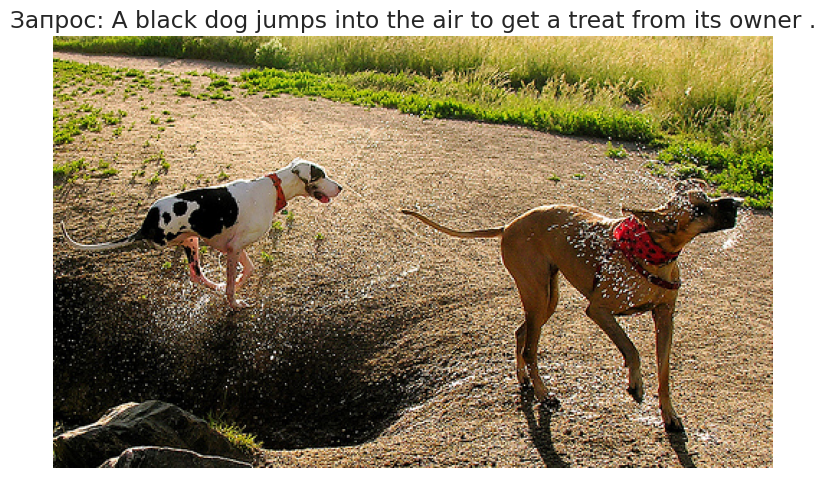

- Эмбеддинги текстов будут созданы...


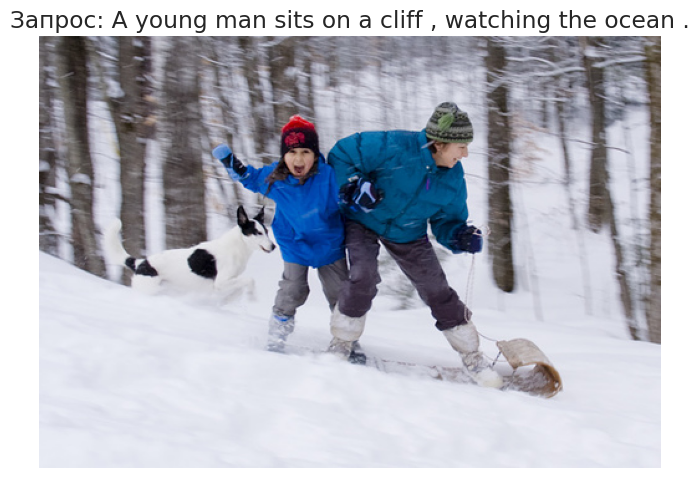

- Эмбеддинги текстов будут созданы...


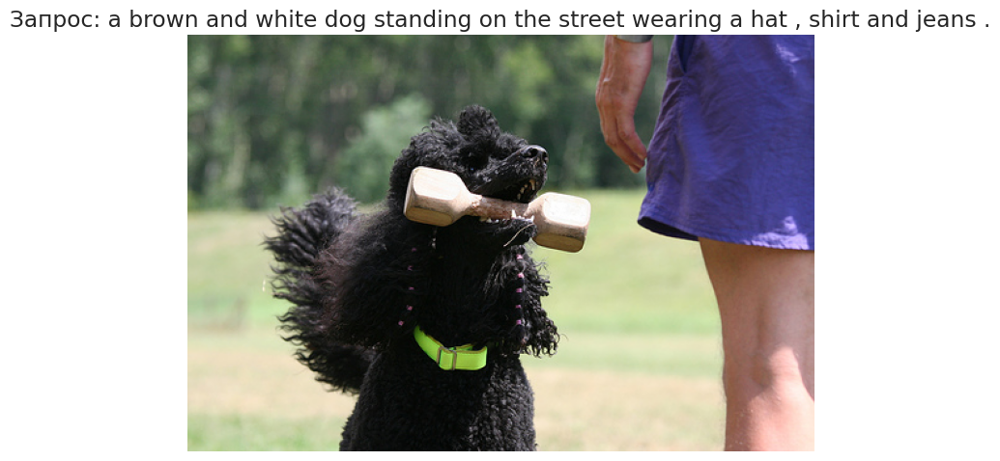

- Эмбеддинги текстов будут созданы...


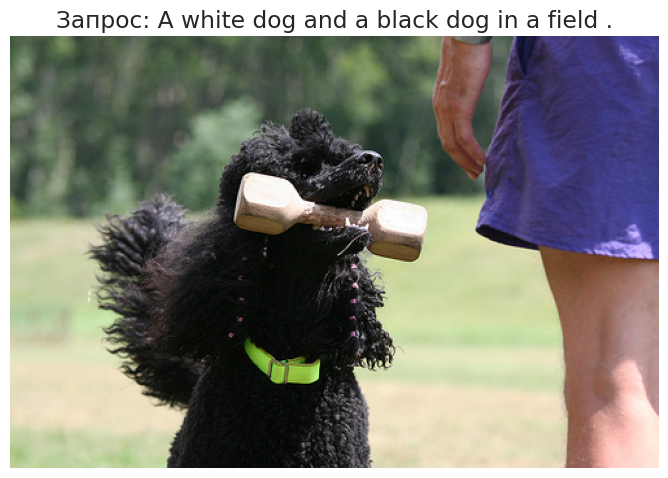

In [46]:
def text_image_match(text : str | list[str],
                     test_image_embeddings : pd.DataFrame = test_image_embeddings,
                     images : pd.Series = test_images.image,
                     model : callable = cbr,
                     stop_words: list = child_related_words,
                     best_params = elnet_best_params,
                     ) -> plt.Figure:
    
    # Преобразуем строчный ввод в список.
    if isinstance(text, str): text = [text]
        
    # переименуем столбцы эмбеддингов изображений.
    len_df = test_image_embeddings.shape[0] 
    
    matcher_lower = PhraseMatcher(nlp.vocab, attr='LOWER')
    patterns_lower = [nlp.make_doc(word) for word in stop_words]
    matcher_lower.add('CHILD_RELATED', None, *patterns_lower)
    matcher_lemma = PhraseMatcher(nlp.vocab, attr='LEMMA')
    patterns_lemma = [nlp(word) for word in stop_words]
    matcher_lemma.add('CHILD_RELATED', None, *patterns_lemma)
    
    
    # Получим эмбединг текстов.
    for t in text:
        matches = matcher_lower(nlp(t))
        matches.extend(matcher_lemma(nlp(t)))

        if matches:
            print_h('This image is unavailable in your '+
                     'country in compliance with local laws.')
            continue        
        
        text_embedding = get_text_embeddings(pd.Series(t), batch_size=1,
                                             verbose=0)

        text_embeddings = pd.DataFrame(np.block([[text_embedding]] * len_df))
        text_embeddings = text_embeddings.add_prefix('text_')
        X_test = test_image_embeddings.join(text_embeddings)
        
        X = pd.concat([train_df.drop(columns=TARGET), val_df.drop(columns=TARGET)])
        y = pd.concat([train_df[TARGET], val_df[TARGET]])
        model.fit(X, y)
        preds = model.predict(X_test)
    
        plt.imshow(Image.open(osjoin(TEST_DIR, images.iloc[preds.argmax()])))
        plt.title(f'Запрос: {t}')
        plt.axis('off')
        plt.xticks([])
        plt.yticks([])
        plt.show();

    
text_image_match(np.random.choice(df_test.query_text.unique(), 10))

Результат работы модели оставляет пространство для работы, но краудсорс оценщикам, думаю, понравилось бы.

In [47]:
notebook_time_end = perf_counter() - notebook_time_start
print(f'Время выполнения ноутбука ≈ {notebook_time_end / 60:.0f} мин.')

Время выполнения ноутбука ≈ 29 мин.


## 8. Выводы   <a name="chapter11"></a>
- МО-задача. 
Регрессионный анализ, обучение с учителем, с минимизацией метрики MAE.
Для демонстрационной версии была обучена MVP-модель, способная по векторному представлению изображения и векторному представлению текста, выдать число от 0 до 1 — показать, насколько текст и картинка подходят друг другу.
- Были соблюдены юридические ограничения. 
При появлении в запросе “вредного” контента, отображается дисклеймер:
This image is unavailable in your country in compliance with local laws. Также "вредный" контент был удален из обучающей выборки.

- Данные были загружены, был проведён исследовательский анализ и предобработка.
- Уникальные пары изображение-id запроса были объединены внешний слиянием, размер результирующего датафрейма после очистки более 35000 объектов.
- Данные были очищены от контента с детской тематикой.
- Текстовые описания и изображения были векторизованы и конкатенированы в одну матрицу.

- Модели.
Были обучены следуюшие модели:
  - Линейная регрессия с регуляризацией и без.
  - Полносвязная нейросеть с различной арзитектурой.
  - Градиентный бустинг, который показал лучшее значение целевой метрики.
  
- Была создана функция поиска похожих изображений с отсеиванием вредного контента.- МО-задача. 
Регрессионный анализ, обучение с учителем, с минимизацией метрики MAE.
Для демонстрационной версии была обучена MVP-модель, способная по векторному представлению изображения и векторному представлению текста, выдать число от 0 до 1 — показать, насколько текст и картинка подходят друг другу.
- Были соблюдены юридические ограничения. 
При появлении в запросе “вредного” контента, отображается дисклеймер:
This image is unavailable in your country in compliance with local laws. Также "вредный" контент был удален из обучающей выборки.

- Данные были загружены, был проведён исследовательский анализ и предобработка.
- Уникальные пары изображение-id запроса были объединены внешний слиянием, размер результирующего датафрейма после очистки более 35000 объектов.
- Данные были очищены от контента с детской тематикой.
- Текстовые описания и изображения были векторизованы и конкатенированы в одну матрицу.

- Модели.
Были обучены следуюшие модели:
  - Линейная регрессия с регуляризацией и без.
  - Полносвязная нейросеть с различной арзитектурой.
  - Градиентный бустинг, который показал лучшее значение целевой метрики.
  
- Была создана функция поиска похожих изображений с отсеиванием вредного контента.